# Classcification image by Neural Network

Guang YANG, 22318176; \\
LyHeng LAO, 22020475.

**Convolutional neural networks** (CNNs or ConvNet) are a type of deep learning model widely used in image recognition, video analysis, and similar tasks. They utilize convolutional layers to automatically and efficiently extract features.

We will briefly explain the principles of CNNs (Convolutional Neural Networks) and have applied related algorithms in practice—we conducted several **image recognition** tasks, which essentially are data classification problems.

For foundational descriptions, one can refer to Stanford University's course "Convolutional Neural Networks for Visual Recognition" (https://cs231n.github.io/).

## Images and Three-Dimensional Arrays

We have already studied numerous methods for classifying two-dimensional data. In fact, each grayscale image can be considered as a set of two-dimensional data. We can view the arrangement of pixels in a grayscale image as a matrix; the elements of the matrix (pixel values) typically represent intensity levels ranging from black to white. Black is usually represented by a value of 0, white by the highest value (255 in 8-bit images), and shades of gray fall in between.

Compared to grayscale images, color images are represented through the combination of three color channels (red, green, and blue), with each channel being a two-dimensional array. These three color channels are superimposed to form a three-dimensional array.
Therefore, the three-dimensional representation of a color image is (height, width, 3), where "3" represents the three color channels.

As a special case, the three-dimensional representation of a grayscale image can be (height, width, 1).

## The Structure and Advantages of CNNs

Regular neural networks (i.e., fully connected neural networks) face several limitations when handling image data

1. **High Dimensionality of Input**:
   - Images typically have high dimensions. For example, a simple 256x256 pixel grayscale image has 65,536 pixels, and color images have even more. In fully connected networks, each input pixel connects to every neuron in the next layer, leading to a rapid increase in the number of parameters. This not only increases the computational burden but also the risk of overfitting.

2. **Lack of Parameter Sharing and Local Connectivity**:
   - Neurons in regular neural networks are fully connected, meaning the network doesn’t exploit the spatial hierarchical structure of image data.

3. **Computational Efficiency**:
   - Due to the large number of parameters, fully connected networks are often less computationally efficient when processing large-scale image data.

4. **Spatial Invariance**:
   - Regular neural networks lack spatial invariance (i.e., insensitivity to changes in the position of objects in the image).


Due to these reasons, although it is theoretically possible to use regular neural networks for image processing, in practice they are often not effective enough. **This is why we need "Convolutional Neural Networks."** They optimize image processing tasks through their unique structure, making them more efficient and accurate.

Convolutional Neural Networks take advantage of the fact that the input consists of images and they constrain the architecture in a more sensible way. In particular, unlike a regular Neural Network, the layers of a ConvNet have neurons arranged in 3 dimensions: **width, height, depth.** (Note that the word depth here refers to the third dimension of an activation volume, not to the depth of a full Neural Network, which can refer to the total number of layers in a network.)

![CNNs](https://cs231n.github.io/assets/cnn/cnn.jpeg)

A simple CNNs is a sequence of layers, and every layer of a CNNs transforms one volume of activations to another through a differentiable function. We use three main types of layers to build CNNs architectures: **Convolutional Layer**, **Pooling Layer**, and **Fully-Connected Layer** (exactly as seen in regular Neural Networks). We will stack these layers to form a full CNNs architecture.

Here is a schematic diagram.
![average](https://datascientest.com/wp-content/uploads/2020/06/convolution-pooling.png)

Compared to traditional (fully connected) neural networks, the characteristics of Convolutional Neural Networks (CNNs) are mainly reflected in the following aspects:

1. **Convolution Operation**: A notable feature of CNNs is their use of convolutional layers. These layers process data with filters (or convolution kernels) that **effectively capture local features** (such as edges and textures in images). This contrasts sharply with fully connected networks, where each neuron is connected to all neurons of the previous layer.

2. **Parameter Sharing**: In convolutional layers, the weights of the same filter are shared across the entire input data. This weight sharing mechanism significantly reduces the number of parameters in the model, increases computational efficiency, and reduces the risk of overfitting.

3. **Spatial Hierarchical Structure**: CNNs learn the hierarchical spatial structure of input data through multiple layers of convolution and pooling, making them very suitable for processing data with a clear spatial structure, such as images. Fully connected neural networks do not specifically optimize for spatial structure.

4. **Local Connectivity**: Neurons in CNNs are connected only to a local region of the input data, enhancing the model's ability to capture local features. In contrast, neurons in fully connected networks are connected to all neurons of the previous layer, lacking this local structural feature.

5. **Pooling Layers**: CNNs often use pooling layers to reduce the spatial dimensions of feature maps, enhancing the abstracting ability of features and increasing the model's invariance to small positional changes. This is not a standard operation in fully connected networks.

6. **Optimization for Image Processing**: CNNs perform better in processing images and other data with strong spatial structures, as they can effectively handle the inherent characteristics of these types of data. Fully connected networks are generally less effective in this regard.

In summary, CNNs are more efficient than traditional fully connected neural networks in processing data with spatial hierarchical structures (such as images), better at capturing local features.




# Convolution

We will illustrate "convolution" through an example. Let's consider a  matrix $A_{3 \times 4}$ and a matrix $B_{2 \times 2}$:
$$
A = \begin{bmatrix} a_{11} & a_{12} & a_{13} & a_{14} \\
a_{21} & a_{22} & a_{23} & a_{24} \\
a_{31} & a_{32} & a_{33} & a_{34}
\end{bmatrix},
\quad
B = \begin{bmatrix} b_{11} & b_{12} \\ b_{21} & b_{22} \end{bmatrix}
$$

For $E,F \in M_{2 \times 2}(\mathbb{R})$, we define a function
$$
c(E,F)=\sum_{i,j=1}^{2} e_{ij}f_{ij}
$$

Given $A,B$, we have
$$
\begin{aligned}
&c_{11} = c ( \begin{bmatrix} a_{11} & a_{12} \\
a_{21} & a_{22}
\end{bmatrix}),B),
\quad
&c_{12} = c ( \begin{bmatrix} a_{12} & a_{13} \\
a_{22} & a_{23}
\end{bmatrix}),B),
\quad
&c_{13} = c ( \begin{bmatrix} a_{13} & a_{14} \\
a_{23} & a_{24}
\end{bmatrix}),B), \\
&c_{21} = c ( \begin{bmatrix} a_{21} & a_{22} \\
a_{31} & a_{32}
\end{bmatrix}),B),
\quad
&c_{22} = c ( \begin{bmatrix} a_{22} & a_{23} \\
a_{32} & a_{33}
\end{bmatrix}),B),
\quad
&c_{23} = c ( \begin{bmatrix} a_{23} & a_{24} \\
a_{33} & a_{34}
\end{bmatrix}),B).
\end{aligned}
$$

The convolution of $A$ and $B$ can be computed as follows:
$$
C_{2 \times 3} =
\begin{bmatrix} c_{11} & c_{12} & c_{12} \\
c_{21} & c_{22} & c_{23}
\end{bmatrix}
$$
The matrix $B$ here is referred to as the **convolution kernel**  (sometimes also referred to as a **filter**) .

Here is a schematic diagram.

<img src="https://images2015.cnblogs.com/blog/1042406/201703/1042406-20170301113126032-1940584843.png" width="500">

**Different convolution kernels have different effects on images. Here are some examples:**

Blurring convolution kernel：
$$
\frac{1}{9}
\begin{bmatrix} 1 & 1 & 1 \\
1 & 1 & 1 \\
1 & 1 & 1
\end{bmatrix}
$$
Sharpening convolution kernel:
$$
\begin{bmatrix} 0 & -1 & 0 \\
-1 & 5 & -1 \\
0 & -1 & 0
\end{bmatrix}
$$

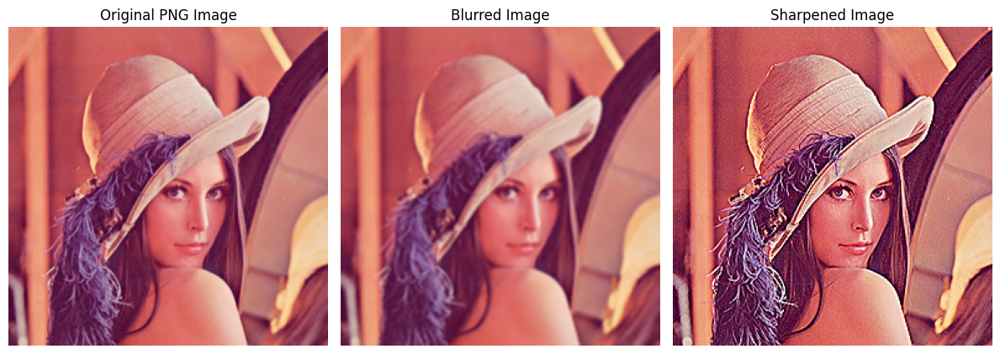

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import requests
from PIL import Image
from io import BytesIO
import cv2
import numpy as np

# 定义一个函数来加载PNG图像
def load_png_image(image_url):
    response = requests.get(image_url)
    image = Image.open(BytesIO(response.content))
    return image

# 下载PNG图像到本地并加载
image_url = 'https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png'
original_image = load_png_image(image_url)

# 将PIL图像转换为NumPy数组
#original_image_np = np.array(original_image)
original_image_np = np.array(original_image.resize((256, 256)))

# 定义模糊卷积核
blur_kernel = np.array([[1, 1, 1],
                         [1, 1, 1],
                         [1, 1, 1]]) / 9.0

# 定义锐化卷积核
sharpen_kernel = np.array([[0, -1, 0],
                            [-1, 5,-1],
                            [0, -1, 0]])

# 应用卷积操作到每个通道
blurred_image = cv2.filter2D(original_image_np, -1, blur_kernel)
sharpened_image = cv2.filter2D(original_image_np, -1, sharpen_kernel)

# 显示原始PNG图像和处理后的图像
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.imshow(original_image_np)
plt.title('Original PNG Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(blurred_image)
plt.title('Blurred Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(sharpened_image)
plt.title('Sharpened Image')
plt.axis('off')

plt.tight_layout()
plt.show()



Gaussian blurring convolution kernel:
$$
\frac{1}{16}
\begin{bmatrix} 1 & 2 & 1 \\
2 & 4 & 2 \\
1 & 2 & 1
\end{bmatrix}
$$

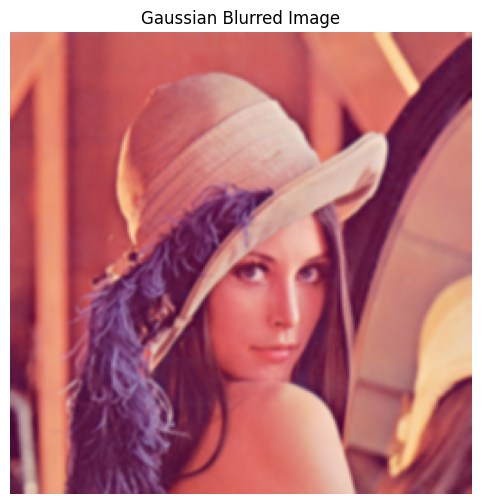

In [ ]:
# 定义高斯模糊卷积核
gaussian_blur_kernel = np.array([[1, 2, 1],
                                  [2, 4, 2],
                                  [1, 2, 1]]) / 16.0

# 应用高斯模糊
blurred_image = cv2.filter2D(original_image_np, -1, gaussian_blur_kernel)

# 显示高斯模糊后的图像
plt.figure(figsize=(6, 6))
plt.imshow(blurred_image)
plt.title('Gaussian Blurred Image')
plt.axis('off')
plt.show()

Sobel edge detection convolution kernel (**emphasizing edge differences**):

$$
\begin{bmatrix} -1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{bmatrix}
$$
Scharr edge detection convolution kernel (**emphasizing mid-values**):
$$
\begin{bmatrix} -1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{bmatrix}
$$

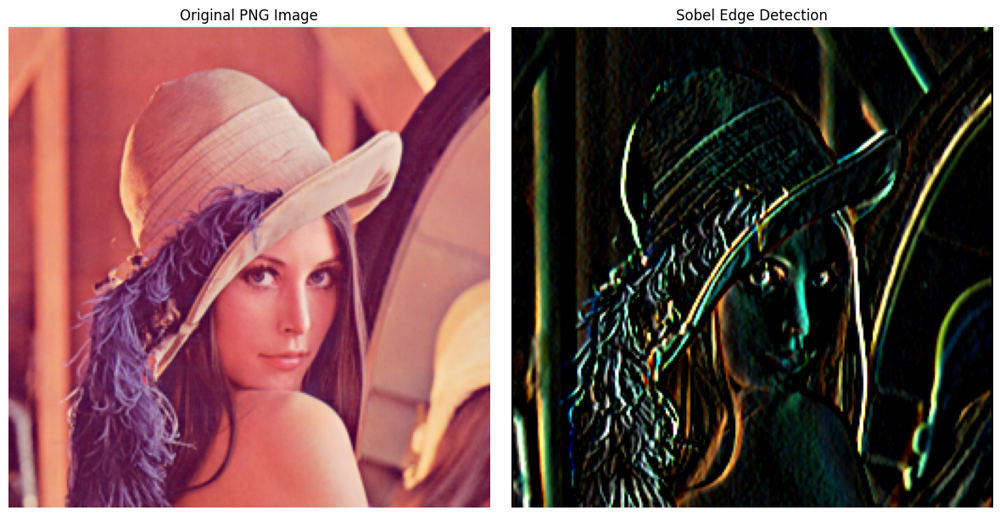

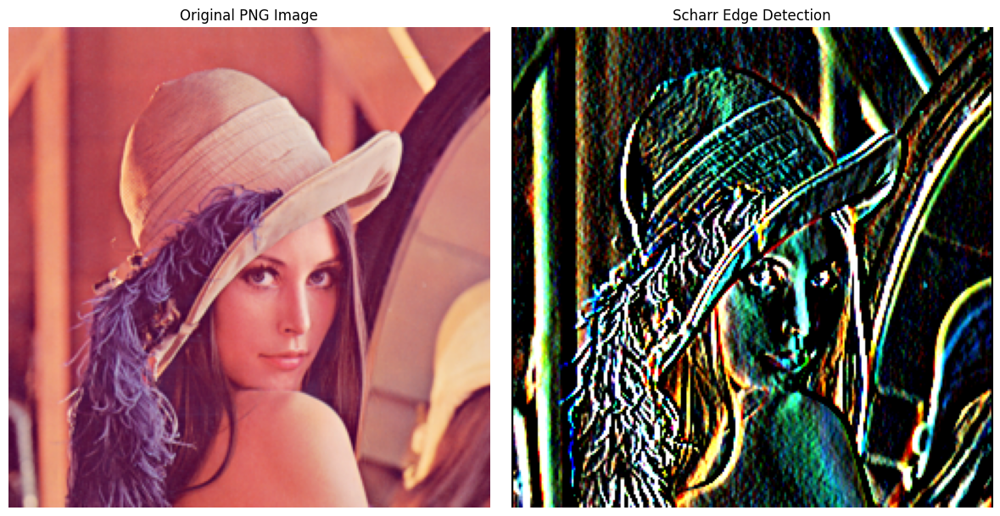

In [ ]:
# 定义Sobel边缘检测卷积核（突出边缘差异）
sobel_edge_kernel = np.array([[-1, 0, 1],
                              [-2, 0, 2],
                              [-1, 0, 1]])

# 定义Scharr边缘检测卷积核（突出中间值）
scharr_edge_kernel = np.array([[-3, 0, 3],
                               [-10, 0, 10],
                               [-3, 0, 3]])

# 应用Sobel边缘检测卷积核
sobel_edge_image = cv2.filter2D(original_image_np, -1, sobel_edge_kernel)

# 应用Scharr边缘检测卷积核
scharr_edge_image = cv2.filter2D(original_image_np, -1, scharr_edge_kernel)

# 显示原始PNG图像和边缘检测效果
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(original_image_np)
plt.title('Original PNG Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(sobel_edge_image, cmap='gray')
plt.title('Sobel Edge Detection')
plt.axis('off')

plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(original_image_np)
plt.title('Original PNG Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(scharr_edge_image, cmap='gray')
plt.title('Scharr Edge Detection')
plt.axis('off')

plt.tight_layout()
plt.show()

# Pooling Layer

It is common to periodically insert a Pooling layer in-between successive Convolution layers in a CNNs architecture. Its function is to progressively reduce the spatial size of the representation to reduce the amount of parameters and computation in the network, and hence to also control overfitting. The Pooling Layer operates independently on every depth slice of the input and resizes it spatially, using the **MAX** and **Average** operation. The most common form is a pooling layer with filters of size 2x2 applied with a stride of 2 downsamples every depth slice in the input by 2 along both width and height.

Here is a schematic diagram of **Max Pooling** and **Average Pooling**.


![max-average](https://www.researchgate.net/publication/349921480/figure/fig2/AS:999677281460235@1615353045589/Max-pooling-and-average-pooling.png)


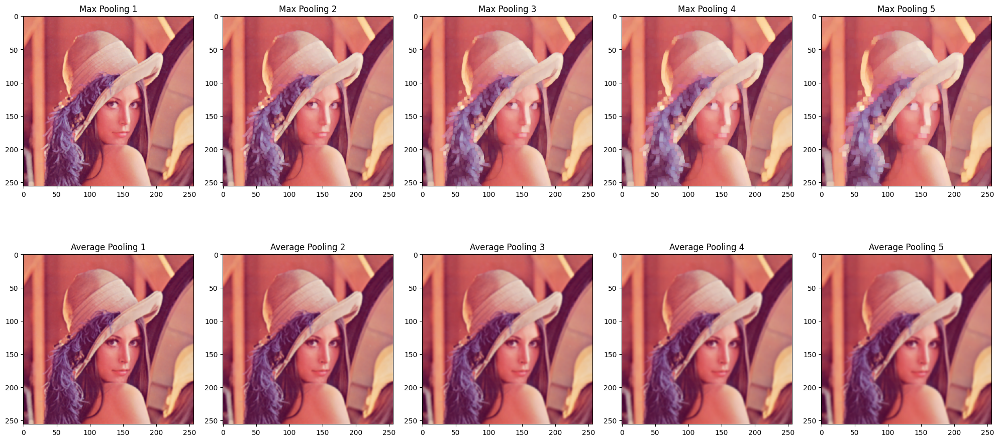

In [ ]:
from scipy import ndimage


# 假设 original_image_np 是你的原始图像
# 假设 pool_size 是池化操作的尺寸

# 对于最大池化和平均池化，分别创建两个图像的副本
max_pooling_image = np.copy(original_image_np)
average_pooling_image = np.copy(original_image_np)

# 创建一个图形，用于显示所有池化后的图像
plt.figure(figsize=(20, 10))
pool_size = 2

# 进行5次池化操作
for i in range(5):
    # 最大池化
    for channel in range(3):
        max_pooling_image[:, :, channel] = ndimage.maximum_filter(max_pooling_image[:, :, channel], size=pool_size)

    # 显示最大池化后的图像
    plt.subplot(2, 5, i+1)
    plt.imshow(max_pooling_image)
    plt.title(f"Max Pooling {i+1}")

    # 平均池化
    for channel in range(3):
        average_pooling_image[:, :, channel] = ndimage.uniform_filter(average_pooling_image[:, :, channel], size=pool_size)

    # 显示平均池化后的图像
    plt.subplot(2, 5, i+6)
    plt.imshow(average_pooling_image)
    plt.title(f"Average Pooling {i+1}")

plt.tight_layout()
plt.show()


#  The backpropagation algorithm of CNNs.

$$
\text{From    }
a^l=\sigma\left(z^l\right)=\sigma\left(W^l a^{l-1}+b^l\right)
\text{    to    }
a^l=\sigma\left(z^l\right)=\sigma\left(a^{l-1} * W^l+b^l\right)
$$

## Review of the Neural Network Model

### Notations

Here is a simple neural network model. Let's first clarify the notation.

<img src="https://images2015.cnblogs.com/blog/1042406/201702/1042406-20170220142015116-1152957081.png" width="500">


For the outputs of the second layer $a_1^2, a_2^2, a_3^2$, we have:
$$
\begin{aligned}
& a_1^2=\sigma\left(z_1^2\right)=\sigma\left(w_{11}^2 x_1+w_{12}^2 x_2+w_{13}^2 x_3+b_1^2\right) \\
& a_2^2=\sigma\left(z_2^2\right)=\sigma\left(w_{21}^2 x_1+w_{22}^2 x_2+w_{23}^2 x_3+b_2^2\right) \\
& a_3^2=\sigma\left(z_3^2\right)=\sigma\left(w_{31}^2 x_1+w_{32}^2 x_2+w_{33}^2 x_3+b_3^2\right)
\end{aligned}
$$

For the output of the third layer $a_1^3$, we have:
$$
a_1^3=\sigma\left(z_1^3\right)=\sigma\left(w_{11}^3 a_1^2+w_{12}^3 a_2^2+w_{13}^3 a_3^2+b_1^3\right)
$$

Generally, assuming that the $l-1$th layer has $\mathrm{m}$ neurons, for the output of the $\mathrm{j}$th neuron in the $l$th layer, $a_j^l$, we have:
$$
a_j^l=\sigma\left(z_j^l\right)=\sigma\left(\sum_{k=1}^m w_{j k}^l a_k^{l-1}+b_j^l\right)
$$
In matrix form, this can be written as:
$$
a^l=\sigma\left(z^l\right)=\sigma\left(W^l a^{l-1}+b^l\right)
$$

### Neural Networks' Back propagation algorithm


Let's consider the following loss function,
$$
J(W, b, x, y)=\frac{1}{2}\left\|a^L-y\right\|_2^2.
$$

For the $L$-th output layer, we have
$$
a^L=\sigma\left(z^L\right)=\sigma\left(W^L a^{L-1}+b^L\right).
$$

In this case, for the parameters of the output layer, our loss function becomes:
$$
J(W, b, x, y)=\frac{1}{2}\left\|a^L-y\right\|_2^2=\frac{1}{2}\left\|\sigma\left(W^L a^{L-1}+b^L\right)-y\right\|_2^2
$$

So the gradients of $J$ along $w$ and $b$ are
$$
\begin{gathered}
\frac{\partial J(W, b, x, y)}{\partial W^L}=\left[\left(a^L-y\right) \odot \sigma^{\prime}\left(z^L\right)\right]\left(a^{L-1}\right)^T \\
\frac{\partial J(W, b, x, y)}{\partial b^L}=\left(a^L-y\right) \odot \sigma^{\prime}\left(z^L\right)
\end{gathered}
$$

The symbol $\odot$ represents the **Hadamard product**. For two vectors of the same dimension $A = \left(a_1, a_2, \ldots a_n\right)^T$ and $B = \left(b_1, b_2, \ldots b_n\right)^T$,
$$
A \odot B=\left(a_1 b_1, a_2 b_2, \ldots a_n b_n\right)^T
$$
We define
$$
\delta^L :=\frac{\partial J(W, b, x, y)}{\partial z^L}=\left(a^L-y\right) \odot \sigma^{\prime}\left(z^L\right)
$$

According to the chain rule for differentiation in calculus, we have:
$$
\delta^l=\frac{\partial J(W, b, x, y)}{\partial z^l}=\left(\frac{\partial z^{l+1}}{\partial z^l}\right)^T \frac{\partial J(W, b, x, y)}{\partial z^{l+1}}=\left(\frac{\partial z^{l+1}}{\partial z^l}\right)^T \delta^{l+1}
$$



Therefore,
$$
\frac{\partial J(W, b, x, y)}{\partial W^l}=\delta^l\left(a^{l-1}\right)^T, \quad \quad
\frac{\partial J(W, b, x, y)}{\partial b^l}=\delta^l
$$

Since
$$
z^{l+1}=W^{l+1} a^l+b^{l+1}=W^{l+1} \sigma\left(z^l\right)+b^{l+1}
$$
we have
$$
\frac{\partial z^{l+1}}{\partial z^l}=W^{l+1} \operatorname{diag}\left(\sigma^{\prime}\left(z^l\right)\right)
$$



By substituting the above formula into the relationship between $\delta^{l+1}$and $\delta^l$, we get:
$$
\delta^l=\left(\frac{\partial z^{l+1}}{\partial z^l}\right)^T \frac{\partial J(W, b, x, y)}{\partial z^{l+1}}=\operatorname{diag}\left(\sigma^{\prime}\left(z^l\right)\right)\left(W^{l+1}\right)^T \delta^{l+1}=\left(W^{l+1}\right)^T \delta^{l+1} \odot \sigma^{\prime}\left(z^l\right)
$$

### Summery

In Neural Networks, we first calculate the $\delta^L$ of the output layer:
$$
\delta^L=\frac{\partial J(W, b)}{\partial z^L}=\frac{\partial J(W, b)}{\partial a^L} \odot \sigma^{\prime}\left(z^L\right)
$$

Using mathematical induction and starting with the value of $\delta^{l+1}$, we step by step calculate the $\delta^l$ for the first layer, with the expression being:
$$
\delta^l=\left(\frac{\partial z^{l+1}}{\partial z^l}\right)^T \delta^{l+1}=\left(W^{l+1}\right)^T \delta^{l+1} \odot \sigma^{\prime}\left(z^l\right)
$$

With the expression for $\delta^l$, we can then derive the gradient expressions for $W$ and $b$:
$$
\begin{aligned}
& \frac{\partial J(W, b)}{\partial W^l}=\delta^l\left(a^{l-1}\right)^T \\
& \frac{\partial J(W, b, x, y)}{\partial b^l}==\delta^l
\end{aligned}
$$
With the gradient expressions for $W$ and $b$, we can use the **gradient descent method** to optimize $W$ and $b$, and find the final values for all $W$ and $b$.

## Given the $\delta^l$ of the pooling layer, derive the $\delta^{l-1}$ of the previous hidden layer.



In CNNs, "**upsampling**" is an operation used to increase the spatial dimensions (i.e., width and height) of an image or feature map. This operation is the opposite of pooling, which reduces the spatial dimensions. Upsampling is very important in various applications, especially in scenarios where it's necessary to restore the original size of an image or to increase the resolution of a feature map.

We will illustrate upsampling through specific examples.

For example, assume our pooling region size is $2 \times 2$.  The k-th submatrix of $\delta^l$ is
$$
\delta_k^l=\left(\begin{array}{ll}
2 & 8 \\
4 & 6
\end{array}\right)
$$

We first restore $\delta_k^l$, which means
$$
\left(\begin{array}{llll}
0 & 0 & 0 & 0 \\
0 & 2 & 8 & 0 \\
0 & 4 & 6 & 0 \\
0 & 0 & 0 & 0
\end{array}\right)
$$

If the pooling method is $MAX$, and assuming the positions of the maximum values recorded during the forward propagation are respectively top-left, bottom-right, top-right, and bottom-left, then the transformed matrix would be
$$
\left(\begin{array}{llll}
2 & 0 & 0 & 0 \\
0 & 0 & 0 & 8 \\
0 & 4 & 0 & 0 \\
0 & 0 & 6 & 0
\end{array}\right)
$$

If the pooling method is $Average$, then an averaging operation is performed; the transformed matrix would be

$$
\left(\begin{array}{cccc}
0.5 & 0.5 & 2 & 2 \\
0.5 & 0.5 & 2 & 2 \\
1 & 1 & 1.5 & 1.5 \\
1 & 1 & 1.5 & 1.5
\end{array}\right)
$$

In this way, we obtain the $\frac{\partial J(W, b)}{\partial a_k^{L-1}}$ of the previous layer, and
$$
\delta_k^{l-1}=\left(\frac{\partial a_k^{l-1}}{\partial z_k^{l-1}}\right)^T \frac{\partial J(W, b)}{\partial a_k^{l-1}}=u p s a m p l e\left(\delta_k^l\right) \odot \sigma^{\prime}\left(z_k^{l-1}\right)
$$

In this case, the upsample function completes the logic of enlarging the pooling error matrix and redistributing the errors.

In brief,
$$
\delta^{l-1}=u p s a m p l e\left(\delta^l\right) \odot \sigma^{\prime}\left(z^{l-1}\right)
$$

## Given the $\delta^l$ of the convolutional layer, derive the $\delta^{l-1}$ of the previous hidden layer.



For the backward propagation of the convolutional layer, let's first recall the forward propagation formula of the convolutional layer:
$$
a^l=\sigma\left(z^l\right)=\sigma\left(a^{l-1} * W^l+b^l\right)
$$


In neural network algorithms, we know that the recursive relationship between \($\delta^{l-1}$ and $\delta^l$ is:
$$
\delta^l=\frac{\partial J(W, b)}{\partial z^l}=\left(\frac{\partial z^{l+1}}{\partial z^l}\right)^T \frac{\partial J(W, b)}{\partial z^{l+1}}=\left(\frac{\partial z^{l+1}}{\partial z^l}\right)^T \delta^{l+1}
$$

Therefore, to derive the recursive relationship between $\delta^{l-1}$ and $\delta^l$, it is necessary to calculate the expression for $\frac{\partial z^l}{\partial z^{l-1}}$.
Note that the relationship between $z^l$ and $z^{l-1}$ is:
$$
z^l=a^{l-1} * W^l+b^l=\sigma\left(z^{l-1}\right) * W^l+b^l
$$

Therefore, we have
$$
\delta^{l-1}=\left(\frac{\partial z^l}{\partial z^{l-1}}\right)^T \delta^l=\delta^l * \operatorname{rot} 180\left(W^l\right) \odot \sigma^{\prime}\left(z^{l-1}\right)
$$

This formula is actually similar to that in neural network algorithms, but the difference lies in the derivative calculation for expressions involving convolution, where the convolution kernel is rotated by 180 degrees. In the formula, $rot180$ indicates a 180-degree rotation, meaning flipping once vertically and then once horizontally. In neural network algorithms, this operation is simply a matrix transpose.




Let's explain with a simple example why the convolution kernel needs to be flipped.

Assuming the output $a^{l-1}$ of layer $l-1$ is a $3 \times 3$ matrix, the convolution kernel $W^l$ of layer $l$ is a $2 \times 2$ matrix, and using a stride of $1$ pixel, the output $z^l$ will be a $2 \times 2$ matrix.
Simplifying that all $b^l$ are $0$, we have
$$
a^{l-1} * W^l=z^l
$$

That means
$$
\left(\begin{array}{lll}
a_{11} & a_{12} & a_{13} \\
a_{21} & a_{22} & a_{23} \\
a_{31} & a_{32} & a_{33}
\end{array}\right) *\left(\begin{array}{ll}
w_{11} & w_{12} \\
w_{21} & w_{22}
\end{array}\right)=\left(\begin{array}{ll}
z_{11} & z_{12} \\
z_{21} & z_{22}
\end{array}\right)
$$
which equals to
$$
\begin{aligned}
& z_{11}=a_{11} w_{11}+a_{12} w_{12}+a_{21} w_{21}+a_{22} w_{22} \\
& z_{12}=a_{12} w_{11}+a_{13} w_{12}+a_{22} w_{21}+a_{23} w_{22} \\
& z_{21}=a_{21} w_{11}+a_{22} w_{12}+a_{31} w_{21}+a_{32} w_{22} \\
& z_{22}=a_{22} w_{11}+a_{23} w_{12}+a_{32} w_{21}+a_{33} w_{22}
\end{aligned}
$$

We define
$$
\nabla a^{l-1}
:=\frac{\partial J(W, b)}{\partial a^{l-1}}
=\left(\frac{\partial z^l}{\partial a^{l-1}}\right)^T \frac{\partial J(W, b)}{\partial z^l}
=\left(\frac{\partial z^l}{\partial a^{l-1}}\right)^T \delta^l.
$$

The $\frac{\partial z^l}{\partial a^{l-1}}$ corresponds to the value of $W$. Assuming that the backpropagation error corresponding to our $z$ matrix is composed of a $2 \times 2$ matrix with $\delta_{11}, \delta_{12}, \delta_{21}, \delta_{22}$, using the above content, we can write out the 9 scalar values for $\nabla a^{l-1}$.

For example, for the gradient of $a_{11}$, since in the above four equations \$a_{11}$ only has a product relationship with $z_{11}$, we have:
$$
\nabla a_{11}=\delta_{11} w_{11}
$$

For the gradient of $a_{12}$, since in the four equations $a_{12}$ has a product relationship with both $z_{12}$ and $z_{11}$, we have:
$$
\nabla a_{12}=\delta_{11} w_{12}+\delta_{12} w_{11}
$$

Following the same logic, we obtain:
$$
\begin{gathered}
\nabla a_{13}=\delta_{12} w_{12} \\
\nabla a_{21}=\delta_{11} w_{21}+\delta_{21} w_{11} \\
\nabla a_{22}=\delta_{11} w_{22}+\delta_{12} w_{21}+\delta_{21} w_{12}+\delta_{22} w_{11} \\
\nabla a_{23}=\delta_{12} w_{22}+\delta_{22} w_{12} \\
\nabla a_{31}=\delta_{21} w_{21} \\
\nabla a_{32}=\delta_{21} w_{22}+\delta_{22} w_{21} \\
\nabla a_{33}=\delta_{22} w_{22}
\end{gathered}
$$
that is
$$
\left(\begin{array}{cccc}
0 & 0 & 0 & 0 \\
0 & \delta_{11} & \delta_{12} & 0 \\
0 & \delta_{21} & \delta_{22} & 0 \\
0 & 0 & 0 & 0
\end{array}\right) *\left(\begin{array}{cc}
w_{22} & w_{21} \\
w_{12} & w_{11}
\end{array}\right)=\left(\begin{array}{ccc}
\nabla a_{11} & \nabla a_{12} & \nabla a_{13} \\
\nabla a_{21} & \nabla a_{22} & \nabla a_{23} \\
\nabla a_{31} & \nabla a_{32} & \nabla a_{33}
\end{array}\right)
$$



## Given the $\delta^l$ of the convolutional layer, derive the gradients along $W$ and $b$ for that layer.

Since
$$
z^l=a^{l-1} * W^l+b,
$$
we have
$$
\frac{\partial J(W, b)}{\partial W^l}=a^{l-1} * \delta^l \quad \text{ and } \quad
\frac{\partial J(W, b)}{\partial b^l}=\sum_{u, v}\left(\delta^l\right)_{u, v}.
$$

# A simple example: How a basic convolutional neural network operates.

- CNNs Structure：

Data normalization -> Convolutional layer -> Pooling layer -> Convolutional layer -> Pooling layer -> Fully connected layer;

- the activation function for the convolutional layers is "relu":

$$
f(x)=x^{+}=\max (0, x)=\frac{x+|x|}{2}=\left\{\begin{array}{ll}
x & \text { if } x>0, \\
0 & \text { otherwise. }
\end{array} \quad f^{\prime}(x)= \begin{cases}1 & \text { if } x>0 \\
0 & \text { if } x<0\end{cases}\right.
$$

<img src="https://www.researchgate.net/profile/Leo-Pauly/publication/319235847/figure/fig3/AS:537056121634820@1505055565670/ReLU-activation-function.png
" width="350">

- We have applied the **CIFAR-10** dataset, which is **sufficiently simple**.

## CIFAR-10

CIFAR-10 is a standard dataset widely used in computer vision research, created by Alex Krizhevsky, Vinod Nair, and Geoffrey Hinton from the University of Toronto, Canada. It features several key characteristics:

1. **Image Content**: The CIFAR-10 dataset contains images from 10 categories, including airplanes, automobiles, birds, cats, deer, dogs, frogs, horses, ships, and trucks.

2. **Volume of Data**: There are a total of 60,000 color images, with 50,000 for training and 10,000 for testing.

3. **Image Size**: Each image is 32x32 pixels in size, which is relatively small, making CIFAR-10 an ideal choice for beginners to enter the fields of computer vision and machine learning.

4. **Image Format**: The images are in color, with each image having 3 color channels (red, green, and blue).

5. **Challenge**: Despite the small size of the images, the CIFAR-10 dataset still presents a challenging problem as the images contain real-world variability such as different textures, lighting conditions, and object positions.

6. **Widespread Use**: CIFAR-10 is often used to assess the performance of image recognition algorithms. Due to its popularity, most modern image recognition methods report their performance on this dataset.

7. **Benchmarking**: It provides researchers with a commonly used benchmarking platform to compare different machine learning and image processing techniques.

CIFAR-10 is a very important resource for understanding and experimenting with modern image recognition technologies, especially for applications of deep learning and Convolutional Neural Networks (CNNs).

In [ ]:
import tensorflow as tf
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

# 加载CIFAR-10数据集
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

# 数据归一化
x_train, x_test = x_train / 255.0, x_test / 255.0

# 构建模型
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    Flatten(),
    Dense(64, activation='relu'),
    Dense(10, activation='softmax')
])

# 编译模型
model.compile(optimizer=Adam(), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# 训练模型
model.fit(x_train, y_train, epochs=10, validation_data=(x_test, y_test))

# 评估模型
test_loss, test_acc = model.evaluate(x_test, y_test, verbose=2)
print(f"Test accuracy: {test_acc}")


170498071/170498071 [==============================] - 4s 0us/step
Epoch 1/10
1563/1563 [==============================] - 19s 6ms/step - loss: 1.5570 - accuracy: 0.4314 - val_loss: 1.2900 - val_accuracy: 0.5296
Epoch 2/10
1563/1563 [==============================] - 7s 5ms/step - loss: 1.2045 - accuracy: 0.5695 - val_loss: 1.1059 - val_accuracy: 0.6112
Epoch 3/10
1563/1563 [==============================] - 9s 6ms/step - loss: 1.0555 - accuracy: 0.6287 - val_loss: 1.0127 - val_accuracy: 0.6430
Epoch 4/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.9545 - accuracy: 0.6639 - val_loss: 0.9819 - val_accuracy: 0.6535
Epoch 5/10
1563/1563 [==============================] - 8s 5ms/step - loss: 0.8836 - accuracy: 0.6900 - val_loss: 0.9429 - val_accuracy: 0.6748
Epoch 6/10
1563/1563 [==============================] - 9s 6ms/step - loss: 0.8272 - accuracy: 0.7091 - val_loss: 0.9062 - val_accuracy: 0.6872
Epoch 7/10
1563/1563 [==============================] - 8s 5ms/step 

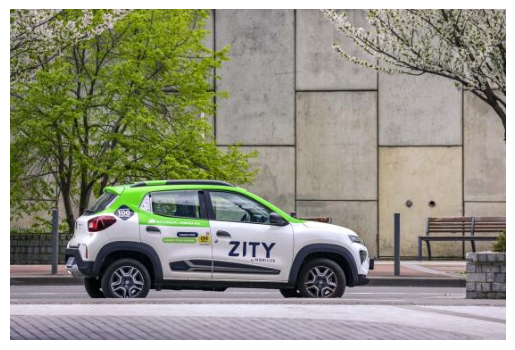

In [ ]:
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt

# 图像的URL
#image_url = 'https://carconfigurator.ferrari.com/rt-assets/data/cars/sf90xxstradale/ui/splashpage.jpg'
image_url = 'https://img.lemde.fr/2023/07/11/0/0/8192/5464/556/0/75/0/5523d8f_1689085808387-rea10118050.jpg'

# 使用requests获取图像内容
response = requests.get(image_url)
image_data = BytesIO(response.content)

# 使用Pillow打开图像
image = Image.open(image_data)

# 使用matplotlib显示图像
plt.imshow(image)
plt.axis('off')  # 不显示坐标轴
plt.show()


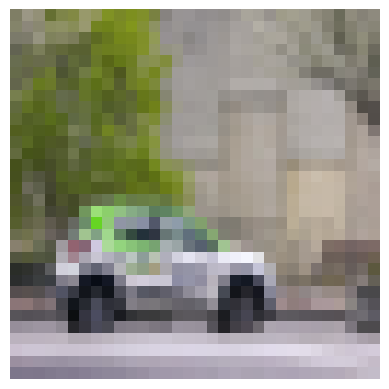

In [ ]:
# 使用Pillow打开图像
original_image = Image.open(image_data)

# 将图像尺寸调整为32x32
resized_image = original_image.resize((32, 32))

# 使用matplotlib显示调整后的图像
plt.imshow(resized_image)
plt.axis('off')  # 不显示坐标轴
plt.show()


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image

img = resized_image  # 使用之前调整尺寸后的图像

# 将图像转换为numpy数组，并进行归一化
img_array = image.img_to_array(img) / 255.0

# 为图像添加一个维度（模型预期的是批次维度）
img_array = np.expand_dims(img_array, axis=0)

# 使用模型进行预测
predictions = model.predict(img_array)

# 打印每个类别的预测概率
class_names = ['Airplane', 'Automobile', 'Bird', 'Cat', 'Deer',
               'Dog', 'Frog', 'Horse', 'Ship', 'Truck']
for i, class_name in enumerate(class_names):
    print(f"{class_name}: {predictions[0][i] * 100:.2f}%")


1/1 [==============================] - 0s 171ms/step
Airplane: 0.97%
Automobile: 61.87%
Bird: 0.05%
Cat: 0.03%
Deer: 0.01%
Dog: 0.02%
Frog: 0.03%
Horse: 0.02%
Ship: 0.17%
Truck: 36.85%


# CNN binary

Populating the interactive namespace from numpy and matplotlib
Shape of the image (320560,)


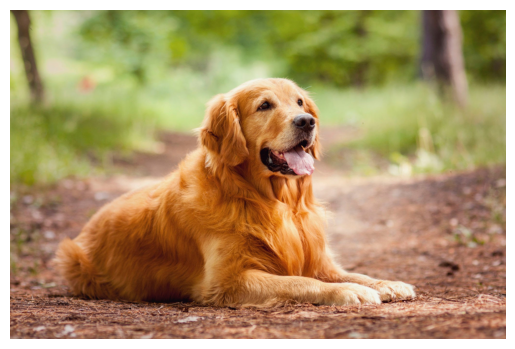

Shape of the image (195753,)


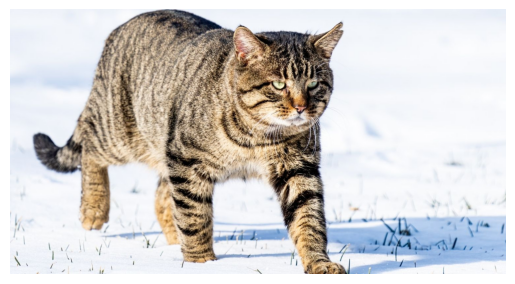

In [ ]:
import cv2
import numpy as np
import requests
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import sys
import datetime
from tensorflow import keras
import tensorflow as tf
from tensorflow.keras.preprocessing import image

%pylab inline

url_chien = r'https://t2.gstatic.com/licensed-image?q=tbn:ANd9GcQOO0X7mMnoYz-e9Zdc6Pe6Wz7Ow1DcvhEiaex5aSv6QJDoCtcooqA7UUbjrphvjlIc'
resp = requests.get(url_chien, stream=True).raw
image_array_chien = np.asarray(bytearray(resp.read()), dtype="uint8")
print(f'Shape of the image {image_array_chien.shape}')
image_chien = cv2.imdecode(image_array_chien, cv2.IMREAD_COLOR)
plt.axis('off')
plt.imshow(cv2.cvtColor(image_chien, cv2.COLOR_BGR2RGB)) #opencv if BGR color, matplotlib usr RGB so we need to switch otherwise the pikachu will be blue ... O:)
plt.show()

url_chat = r'https://s3-eu-west-1.amazonaws.com/blog-ecotree/blog/0001/03/7c1b40313dae3d92dc4043eec621f85b2e07b9a8.jpeg'
resp = requests.get(url_chat, stream=True).raw
image_array_chat = np.asarray(bytearray(resp.read()), dtype="uint8")
print(f'Shape of the image {image_array_chat.shape}')
image_chat = cv2.imdecode(image_array_chat, cv2.IMREAD_COLOR)
plt.axis('off')
plt.imshow(cv2.cvtColor(image_chat, cv2.COLOR_BGR2RGB))
plt.show()

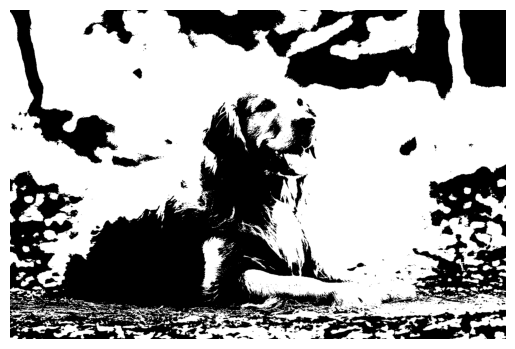

In [ ]:
img_bw = cv2.imdecode(image_array_chien, cv2.IMREAD_GRAYSCALE)
(thresh, img_bw) = cv2.threshold(img_bw, 127, 255, cv2.THRESH_BINARY)
plt.axis('off')
plt.imshow(cv2.cvtColor(img_bw, cv2.COLOR_BGR2RGB))

In [ ]:
!wget --no-check-certificate \
  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
  -O /content/cats_and_dogs_filtered.zip

--2023-11-13 13:44:17--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 142.251.2.207, 2607:f8b0:4023:c0d::cf
Connecting to storage.googleapis.com (storage.googleapis.com)|142.251.2.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘/content/cats_and_dogs_filtered.zip’

/content/cats_and_d 100%[===================>]  65.43M   235MB/s    in 0.3s    

2023-11-13 13:44:17 (235 MB/s) - ‘/content/cats_and_dogs_filtered.zip’ saved [68606236/68606236]



In [ ]:
import os
import zipfile

local_zip = '/content/cats_and_dogs_filtered.zip'

zip_ref = zipfile.ZipFile(local_zip, 'r')

zip_ref.extractall('/content')
zip_ref.close()

In [ ]:
data_dir = '/content/cats_and_dogs_filtered'

train_data = os.path.join(data_dir,'train')
valid_data = os.path.join(data_dir,'validation')

train_dog_data = os.path.join(train_data,'dogs')
train_cat_data = os.path.join(train_data,'cats')

valid_dog_data = os.path.join(valid_data,'dogs')
valid_cat_data = os.path.join(valid_data,'cats')

In [ ]:
print('le nombre d\'image de dog en train_data', len(os.listdir(train_dog_data))) #the number of dog images in train_data
print('le nombre d\'image de cat en train_data', len(os.listdir(train_cat_data))) #the number of cat images in train_data

print('le nombre d\'image de dog en valid_data', len(os.listdir(valid_dog_data))) #the number of dog images in valid_data
print('le nombre d\'image de cat en valid_data', len(os.listdir(valid_dog_data))) #the number of cat images in valid_data

le nombre d'image de dog en train_data 1000
le nombre d'image de cat en train_data 1000
le nombre d'image de dog en valid_data 500
le nombre d'image de cat en valid_data 500


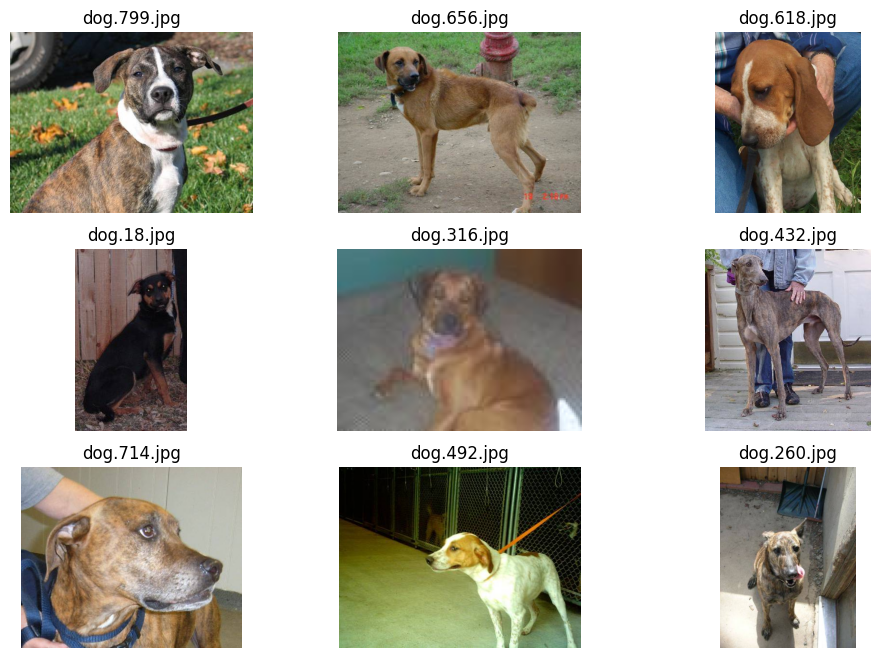

In [ ]:
samples_dogs = np.random.choice(os.listdir(train_dog_data),size = 9)

plt.figure(figsize = (12,8))
for i,dog in enumerate(samples_dogs):
    ax = plt.subplot(3,3,i+1)
    img = mpimg.imread(os.path.join(train_dog_data,dog))
    plt.axis("off")
    plt.imshow(img)
    ax.set_title(dog)

In [ ]:
img = mpimg.imread(os.path.join(train_dog_data,'dog.513.jpg'))
img.shape

(374, 500, 3)

In [ ]:
img = mpimg.imread(os.path.join(train_dog_data,'dog.220.jpg'))
img.shape

(499, 354, 3)

# Construction of Neural Networks for classification (Construction de Réseaux Neuron pour la classification)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rescale = 1/255.0,
    rotation_range=40,  # rotation d'image
    width_shift_range=0.2, # déplacer l'image par rapport à sa largeur
    height_shift_range=0.2,
    shear_range=0.2, # cisailler l'image
    zoom_range=0.2, # la zoom sur image
    horizontal_flip=True, # flip symétrie
    fill_mode='nearest'
)
v_datagen = ImageDataGenerator(rescale = 1/255.0)

train_datagen = datagen.flow_from_directory(train_data, target_size = (150,150), batch_size = 20, class_mode = 'binary')
valid_datagen = v_datagen.flow_from_directory(valid_data, target_size = (150,150), batch_size = 20, class_mode = 'binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


![CNNs-example](https://cs231n.github.io/assets/cnn/convnet.jpeg)

**Foctions activation utilisées:**

Fonction ReLU : $f(x)$ = max(0,x)

Fonction sigmoîd : $f(x)$= $\frac{1}{1 +  e^{-x}}$

In [ ]:
from tensorflow.keras import layers
from tensorflow.keras.models import Model

model = tf.keras.models.Sequential([
    layers.Conv2D(32,(3,3) ,input_shape = (150,150,3),activation = 'relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3) ,activation = 'relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(128,(3,3) ,activation = 'relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(128,(3,3),activation = 'relu'),
    layers.MaxPooling2D((2,2)),

    layers.Flatten(),
    layers.Dense(512,activation = 'relu'),
    layers.Dense(1,activation = 'sigmoid')
])

#model.compile(optimizer = "tf.keras.optimizers.RMSprop(learning_rate=0.001)",loss='binary_crossentropy',metrics = ['acc'])
model.compile(optimizer = "adam",loss='binary_crossentropy',metrics = ['acc']) # optimiseur "adam"

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 74, 74, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 36, 36, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 17, 17, 128)      

In [ ]:
CNN = model.fit(
    train_datagen,
    steps_per_epoch=100,
    epochs=50,
    validation_data=valid_datagen,
    validation_steps=50
)

Epoch 1/50
100/100 [==============================] - 31s 273ms/step - loss: 0.6988 - acc: 0.4945 - val_loss: 0.6928 - val_acc: 0.5030
Epoch 2/50
100/100 [==============================] - 19s 188ms/step - loss: 0.6906 - acc: 0.5510 - val_loss: 0.6715 - val_acc: 0.5960
Epoch 3/50
100/100 [==============================] - 17s 168ms/step - loss: 0.6806 - acc: 0.5490 - val_loss: 0.6876 - val_acc: 0.5290
Epoch 4/50
100/100 [==============================] - 18s 177ms/step - loss: 0.6786 - acc: 0.5435 - val_loss: 0.6716 - val_acc: 0.5650
Epoch 5/50
100/100 [==============================] - 17s 168ms/step - loss: 0.6605 - acc: 0.5750 - val_loss: 0.6878 - val_acc: 0.5620
Epoch 6/50
100/100 [==============================] - 18s 176ms/step - loss: 0.6842 - acc: 0.5675 - val_loss: 0.6422 - val_acc: 0.6210
Epoch 7/50
100/100 [==============================] - 17s 174ms/step - loss: 0.6632 - acc: 0.5910 - val_loss: 0.6551 - val_acc: 0.5580
Epoch 8/50
100/100 [==============================] - 1

In [ ]:
train_acc = CNN.history['acc']
valid_acc = CNN.history['val_acc']

train_loss = CNN.history['loss']
valid_loss = CNN.history['val_loss']
X = len(train_acc)

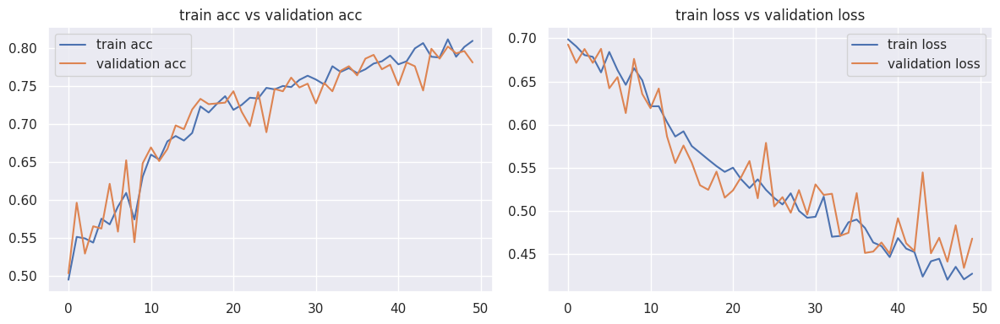

In [ ]:
import seaborn as sns
sns.set()
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

# Plot for accuracy
axs[0].plot(np.arange(X), train_acc, label="train acc")
axs[0].plot(np.arange(X), valid_acc, label="validation acc")
axs[0].set_title("train acc vs validation acc")
axs[0].legend()

# Plot for loss
axs[1].plot(np.arange(X), train_loss, label="train loss")
axs[1].plot(np.arange(X), valid_loss, label="validation loss")
axs[1].set_title("train loss vs validation loss")
axs[1].legend()

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

# Prediction (Prédiction)

**chien**

In [ ]:
def predict(img):
  x = image.img_to_array(img)
  x = x[np.newaxis]
  if model.predict(x) == 0 :
    plt.imshow(img)
    return "c\'est un chat"
  else:
    plt.imshow(img)
    return "c\'est un chien"

Saving chein.jpg to chein.jpg


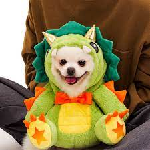

In [ ]:
from google.colab import files
from tensorflow.keras.preprocessing import image

upload = files.upload()
path = list(upload.keys())[0]
img = image.load_img(path,target_size = (150,150))
img

1/1 [==============================] - 0s 19ms/step


"c'est un chien"

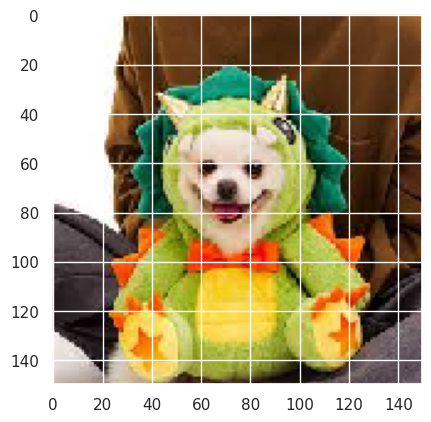

In [ ]:
predict(img)

1/1 [==============================] - 0s 75ms/step


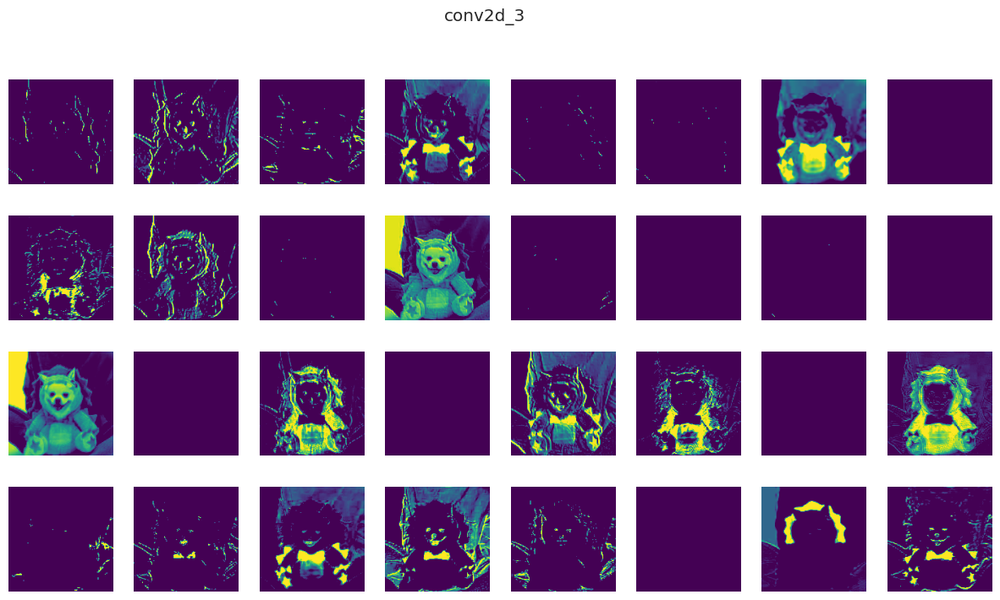

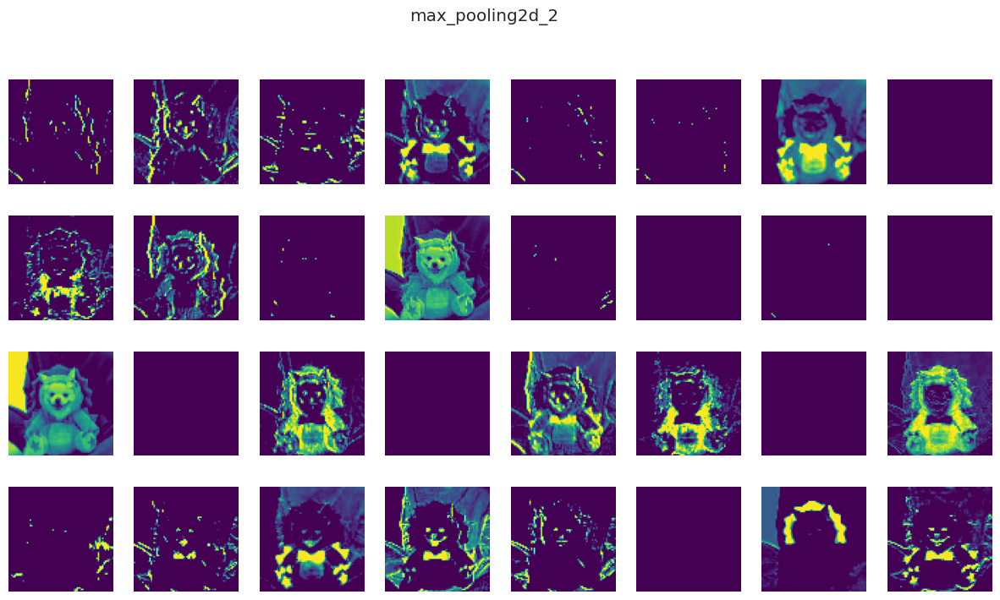

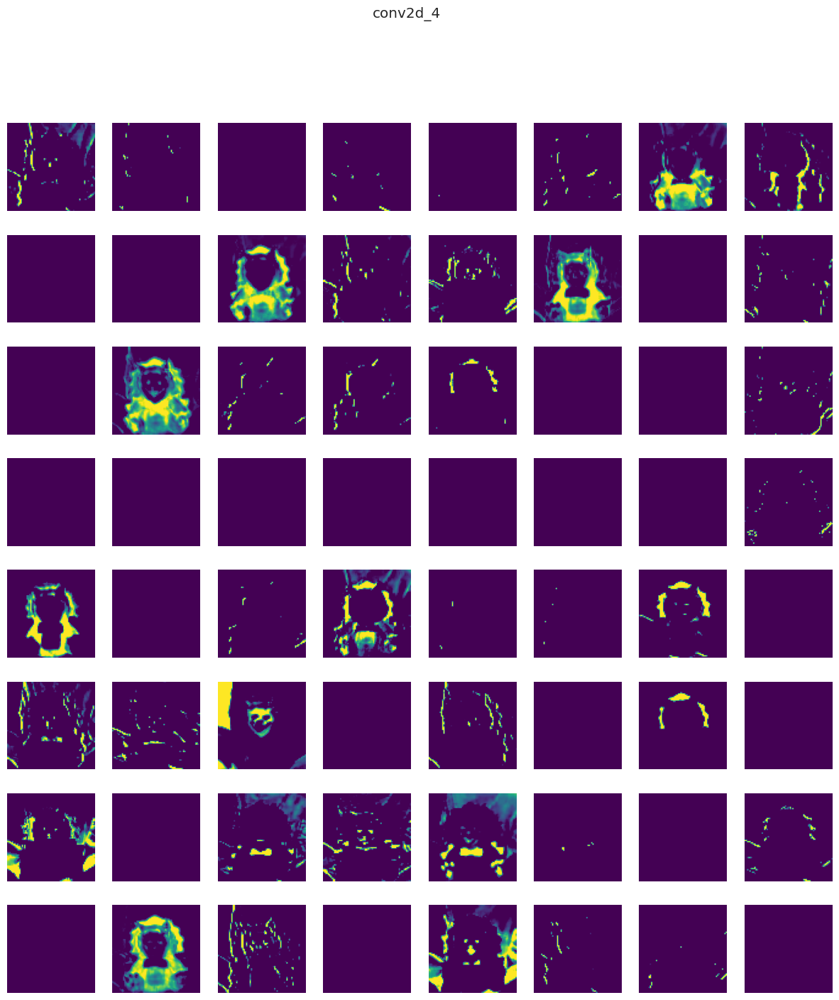

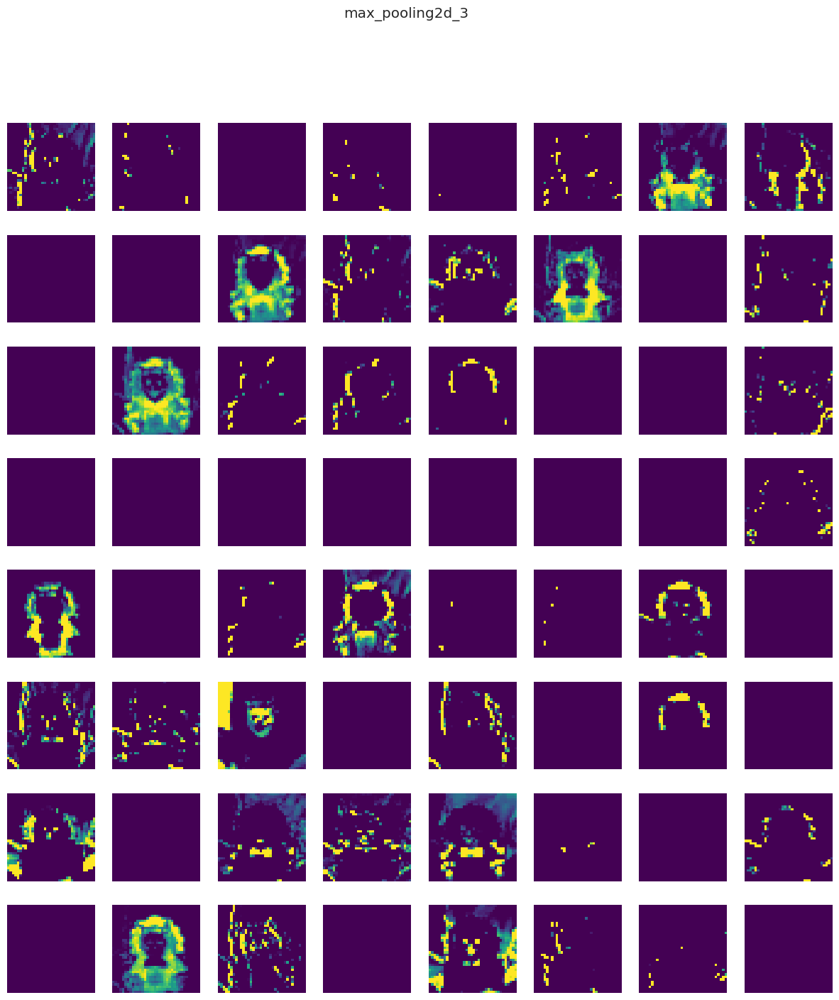

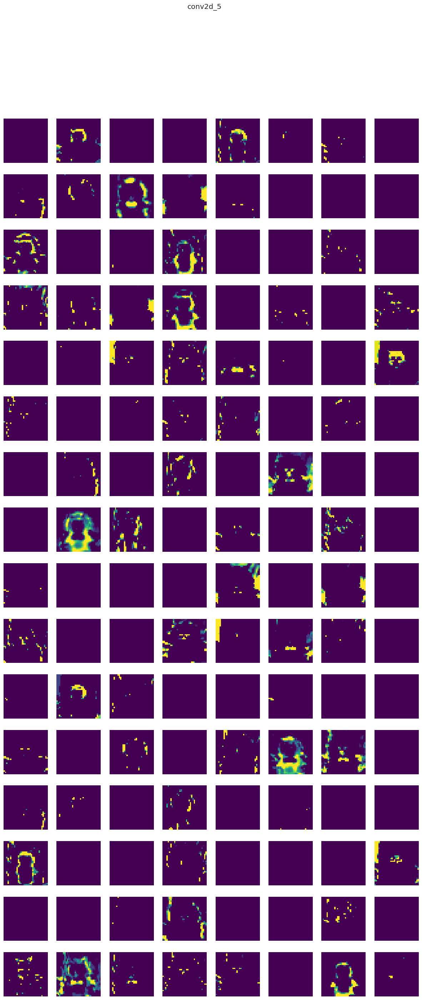

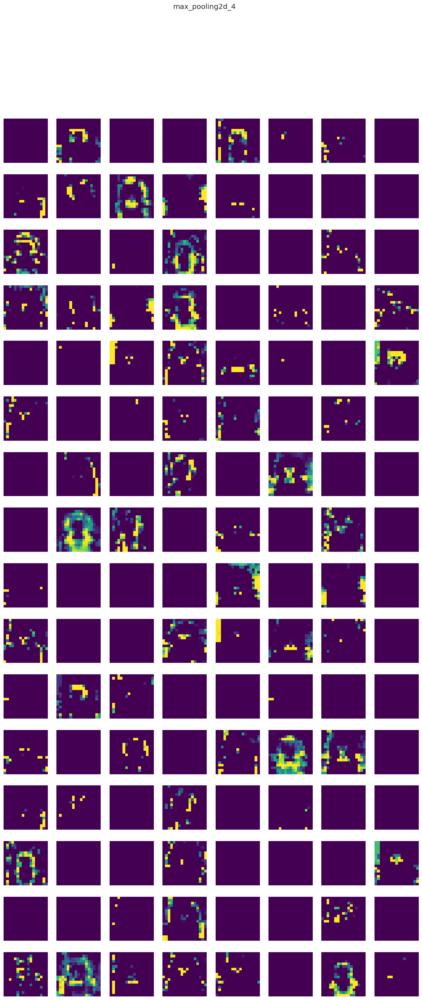

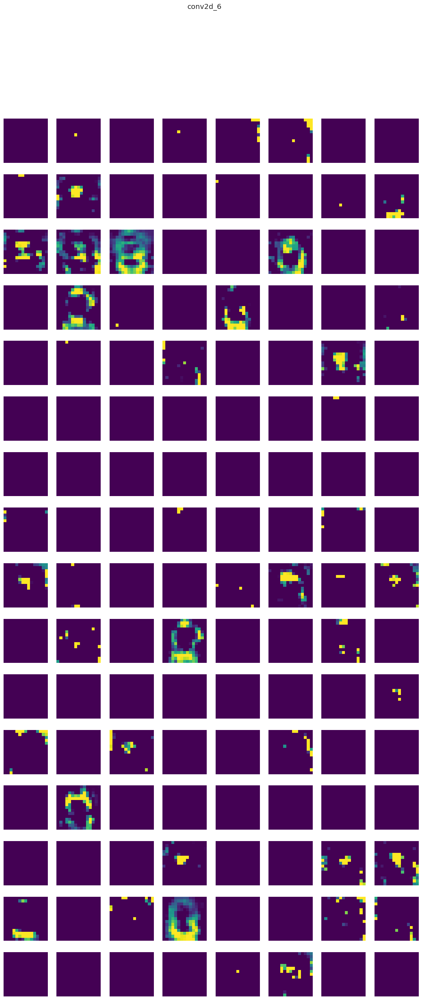

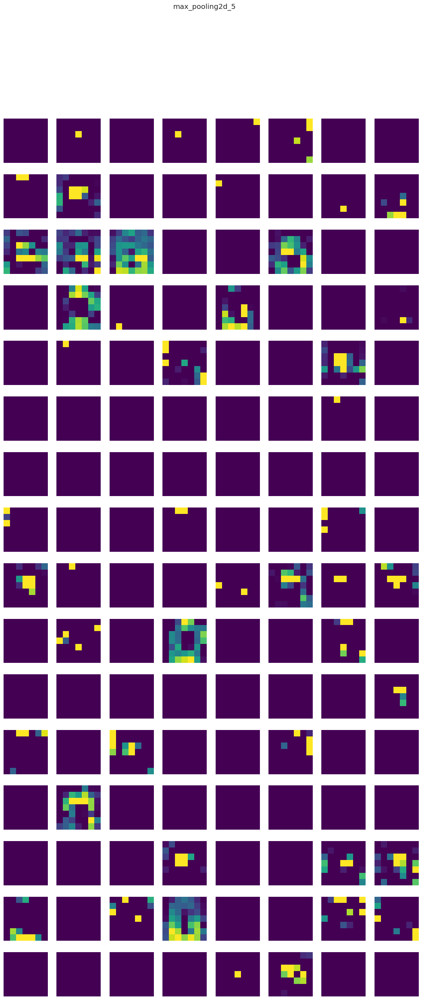

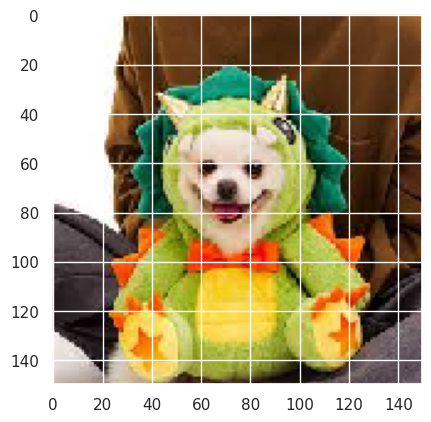

In [ ]:
from tensorflow.keras import models

img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.  # Normaliser les valeurs des pixels

# Créer un modèle intermédiaire pour visualiser les activations de chaque couche
layer_outputs = [layer.output for layer in model.layers[:8]] + [model.layers[-3].output]  # Ajouter la couche dense
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

# Obtenir les activations pour l'image donnée
activations = activation_model.predict(img_tensor)

# Visualiser les activations
layer_names = [layer.name for layer in model.layers[:8]]

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]  # Number of features in the layer
    size = layer_activation.shape[1] if len(layer_activation.shape) > 2 else 1  # Size of spatial activations (height or width, typically the same)

    n_cols = n_features // 8  # Display at most 8 activations per row

    fig, axes = plt.subplots(n_cols, 8, figsize=(15, 2 * n_cols))  # Create subplots

    for col in range(n_cols):
        for row in range(8):
            if len(layer_activation.shape) > 2:
                channel_image = layer_activation[0, :, :, col * 8 + row]
            else:
                channel_image = layer_activation[0, col * 8 + row]

            channel_image -= channel_image.mean()
            channel_image /= (channel_image.std() + 1e-5)  # To avoid division by zero
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')

            axes[col, row].imshow(channel_image, cmap='viridis')
            axes[col, row].axis('off')

    plt.suptitle(layer_name)
    plt.show()

plt.imshow(img)

**chat**

Saving chat.jpg to chat.jpg


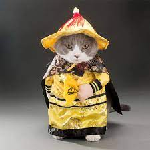

In [ ]:
upload = files.upload()
path = list(upload.keys())[0]
img = image.load_img(path,target_size = (150,150))
img

1/1 [==============================] - 0s 19ms/step


"c'est un chat"

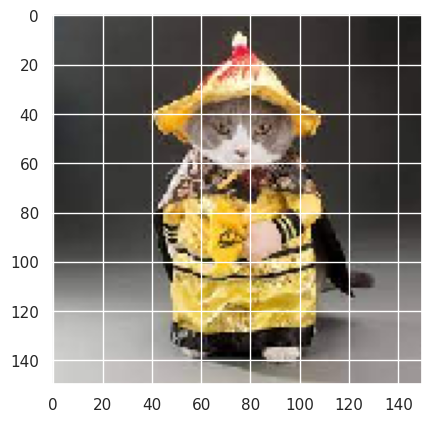

In [ ]:
predict(img)

1/1 [==============================] - 0s 121ms/step


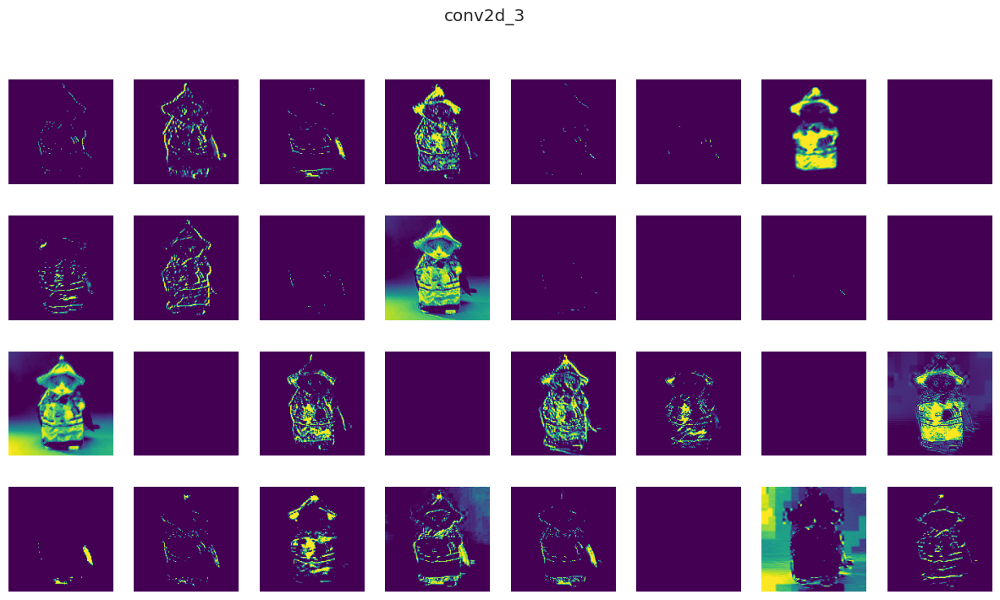

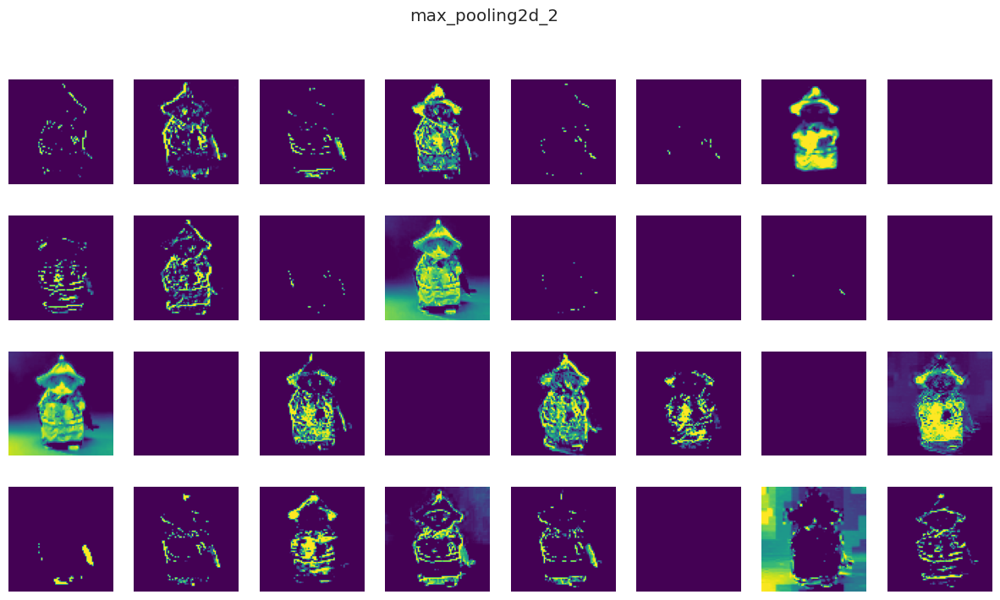

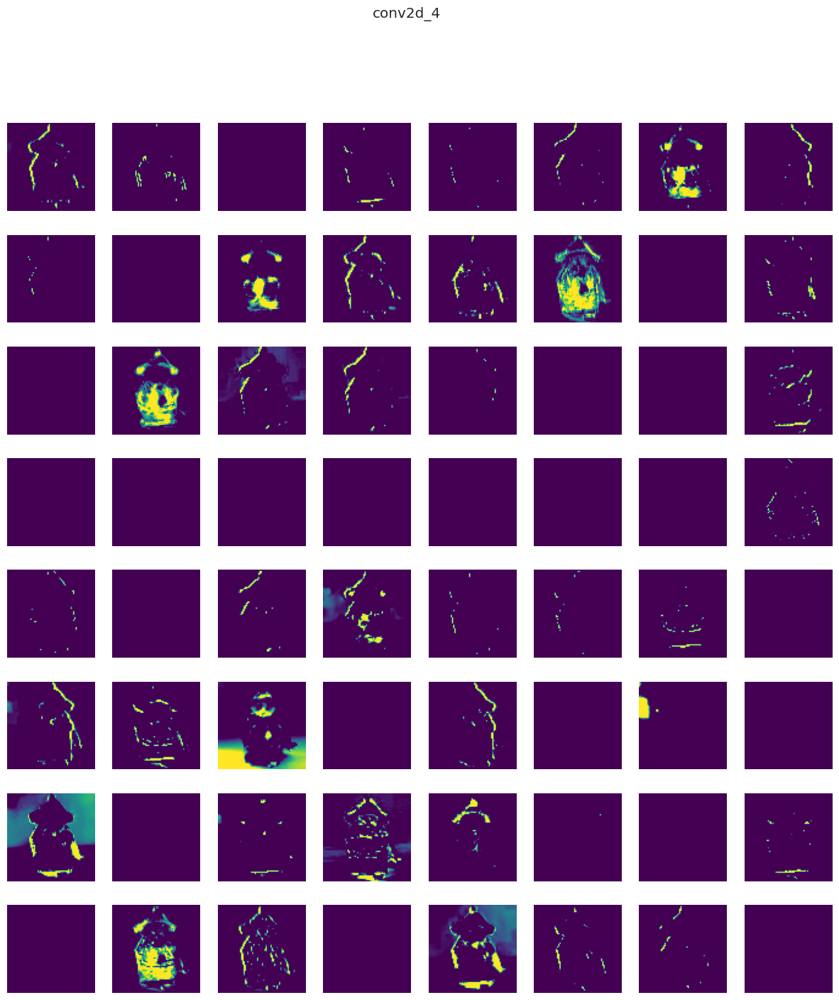

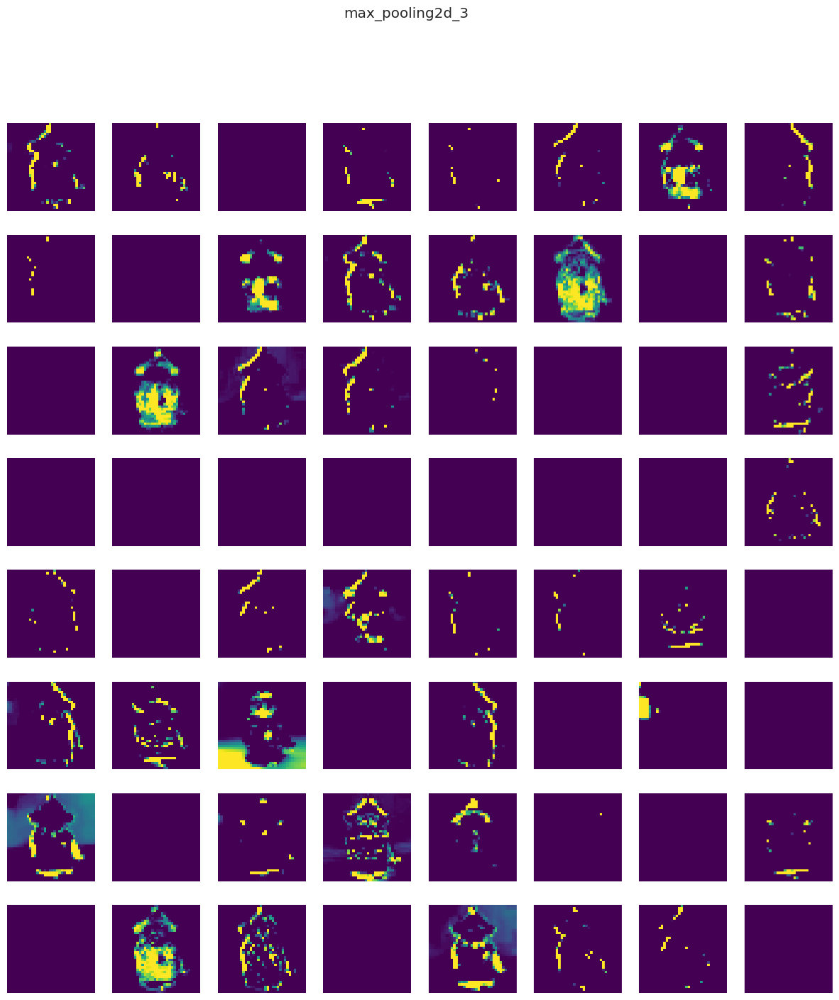

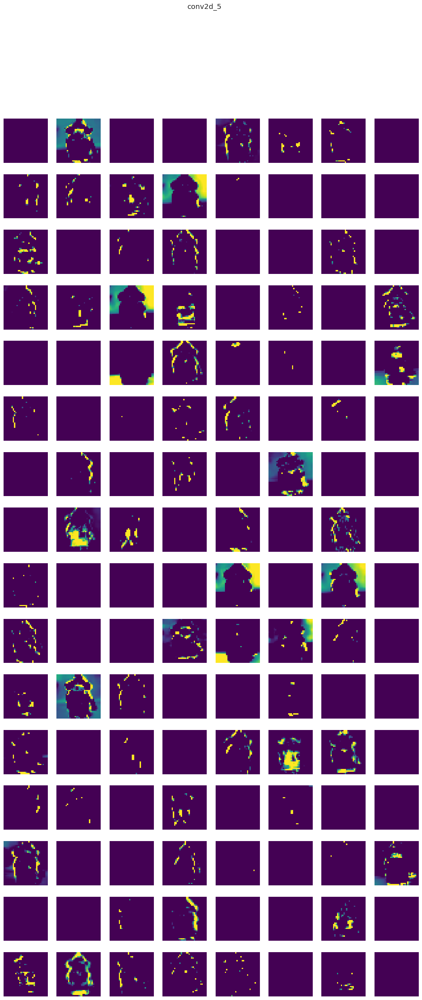

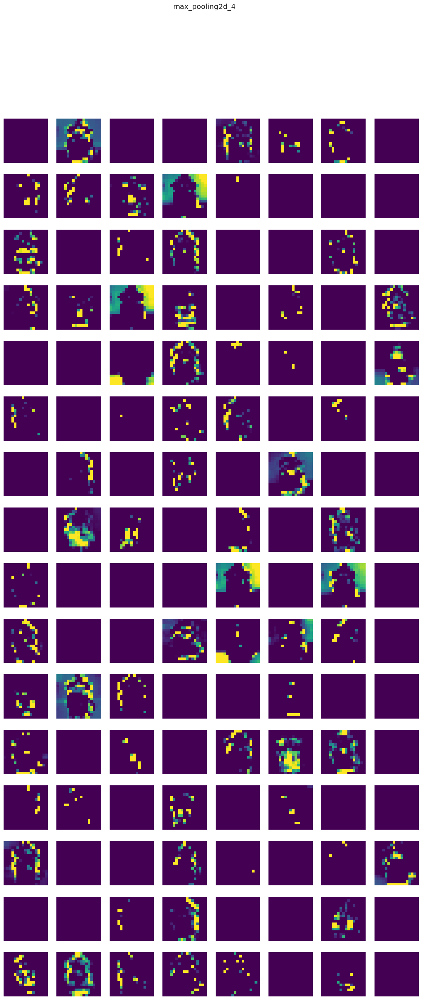

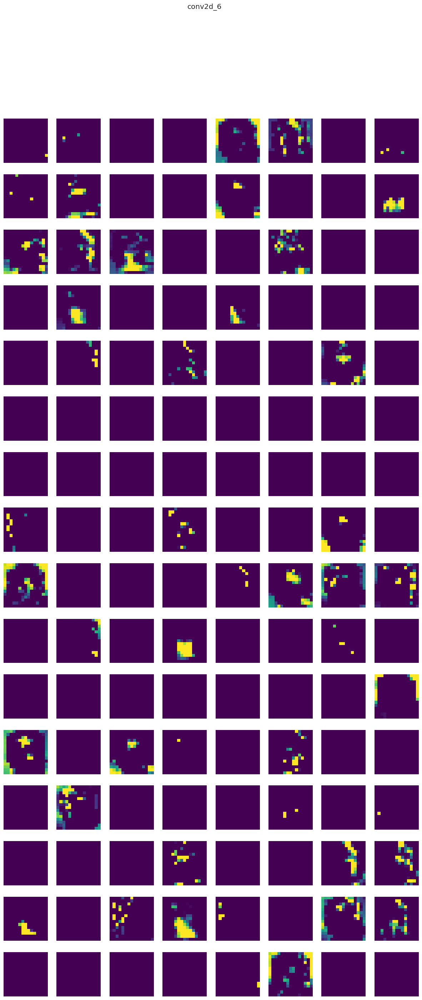

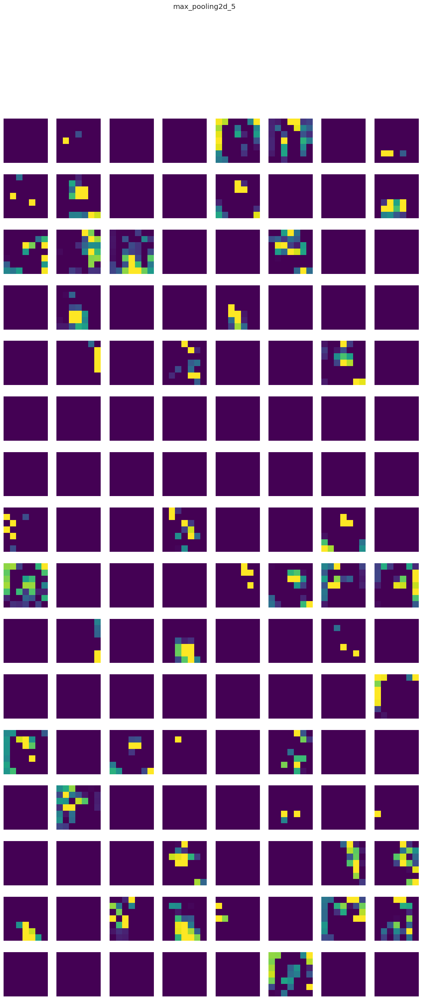

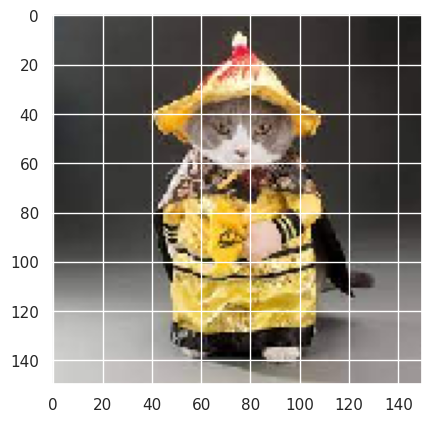

In [ ]:
from tensorflow.keras import models

img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.  # Normaliser les valeurs des pixels

# Créer un modèle intermédiaire pour visualiser les activations de chaque couche
layer_outputs = [layer.output for layer in model.layers[:8]] + [model.layers[-3].output]  # Ajouter la couche dense
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

# Obtenir les activations pour l'image donnée
activations = activation_model.predict(img_tensor)

# Visualiser les activations
layer_names = [layer.name for layer in model.layers[:8]]

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]  # Number of features in the layer
    size = layer_activation.shape[1] if len(layer_activation.shape) > 2 else 1  # Size of spatial activations (height or width, typically the same)

    n_cols = n_features // 8  # Display at most 8 activations per row

    fig, axes = plt.subplots(n_cols, 8, figsize=(15, 2 * n_cols))  # Create subplots

    for col in range(n_cols):
        for row in range(8):
            if len(layer_activation.shape) > 2:
                channel_image = layer_activation[0, :, :, col * 8 + row]
            else:
                channel_image = layer_activation[0, col * 8 + row]

            channel_image -= channel_image.mean()
            channel_image /= (channel_image.std() + 1e-5)  # To avoid division by zero
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')

            axes[col, row].imshow(channel_image, cmap='viridis')
            axes[col, row].axis('off')

    plt.suptitle(layer_name)
    plt.show()

plt.imshow(img)

# CNN category

![max-average](https://miro.medium.com/v2/resize:fit:3744/format:webp/1*SGPGG7oeSvVlV5sOSQ2iZw.png)

**Fonction activation**

softmax :  $f(z_i)$= $\frac{e^{z_i}}{\sum_{j=1}^K e^{z_j}}$

In [ ]:
import numpy as np
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.datasets import mnist
from tensorflow.keras.utils import to_categorical

(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train = x_train.reshape((60000, 28, 28, 1)).astype('float32') / 255
x_test = x_test.reshape((10000, 28, 28, 1)).astype('float32') / 255
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

model = keras.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(28, 28, 1)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])


model.fit(x_train, y_train, epochs=5, batch_size=64, validation_split=0.2)

test_loss, test_acc = model.evaluate(x_test, y_test)
print('Test accuracy:', test_acc)

11490434/11490434 [==============================] - 0s 0us/step
Epoch 1/5
750/750 [==============================] - 18s 5ms/step - loss: 0.2002 - accuracy: 0.9395 - val_loss: 0.0726 - val_accuracy: 0.9784
Epoch 2/5
750/750 [==============================] - 3s 5ms/step - loss: 0.0517 - accuracy: 0.9839 - val_loss: 0.0475 - val_accuracy: 0.9858
Epoch 3/5
750/750 [==============================] - 4s 5ms/step - loss: 0.0370 - accuracy: 0.9878 - val_loss: 0.0481 - val_accuracy: 0.9854
Epoch 4/5
750/750 [==============================] - 4s 6ms/step - loss: 0.0282 - accuracy: 0.9906 - val_loss: 0.0497 - val_accuracy: 0.9865
Epoch 5/5
313/313 [==============================] - 1s 3ms/step - loss: 0.0279 - accuracy: 0.9914
Test accuracy: 0.9914000034332275


In [ ]:
def seconde_max(k):
  predict[0][k] = float(-inf)
  prediction = np.argmax(predict)
  print(f"l'image est un: {prediction}")

Saving 5.jpg to 5 (2).jpg


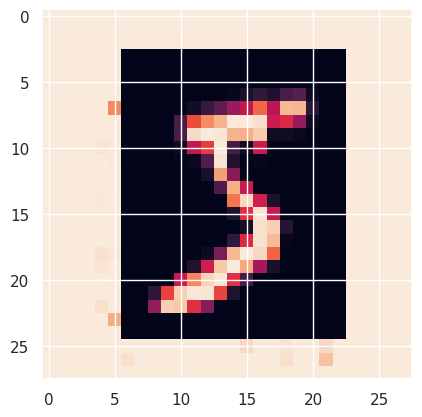

In [ ]:
from google.colab import files
from tensorflow.keras.preprocessing import image

upload = files.upload()
path = list(upload.keys())[0]
img = image.load_img(path, target_size=(28, 28), color_mode='grayscale')
fig=figsize=(8, 8)
plt.imshow(img)

In [ ]:
x = image.img_to_array(img)
x = x[np.newaxis]/255

predict = model.predict(x)

prediction = np.argmax(predict)

print(f"l'image est un: {prediction}")

1/1 [==============================] - 0s 17ms/step
l'image est un: 5


In [ ]:
seconde_max(prediction)

l'image est un: 3


Saving download.png to download (1).png


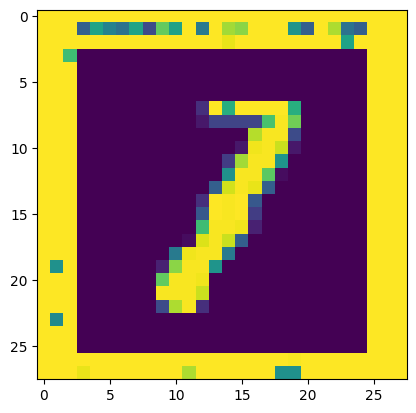

In [ ]:
upload = files.upload()
path = list(upload.keys())[0]
img = image.load_img(path, target_size=(28, 28), color_mode='grayscale')
fig=figsize=(8, 8)
plt.imshow(img)

In [ ]:
x = image.img_to_array(img)
x = x[np.newaxis]/255

predict = model.predict(x)

prediction = np.argmax(predict)

print(f"l'image est un: {prediction}")

1/1 [==============================] - 0s 20ms/step
l'image est un: 7


In [ ]:
seconde_max(prediction)

l'image est un: 1


1/1 [==============================] - 0s 63ms/step


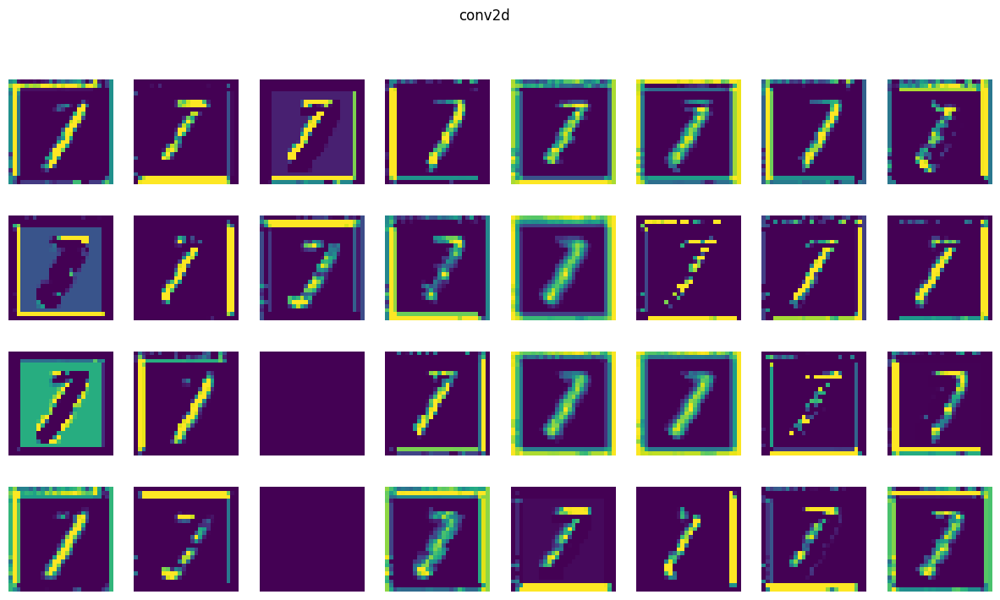

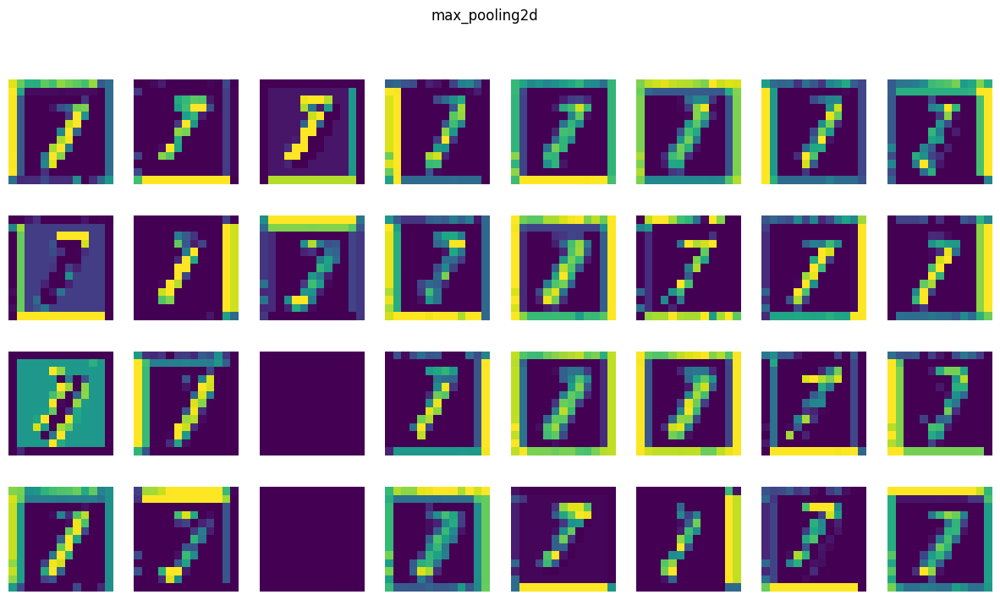

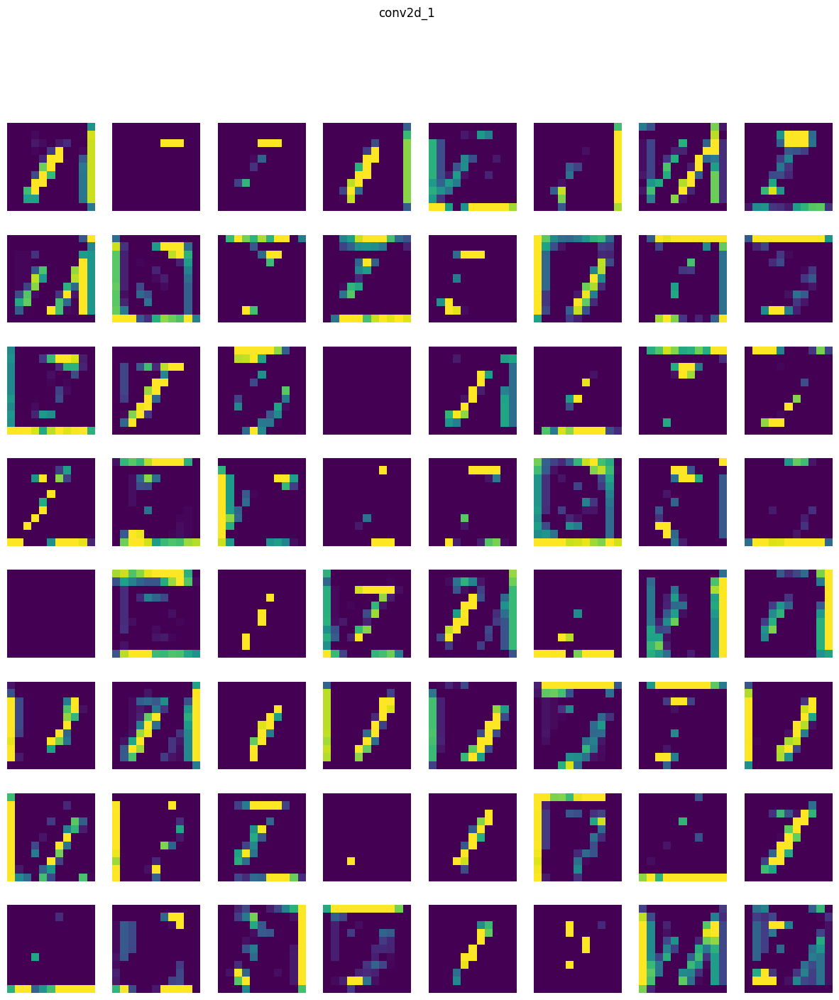

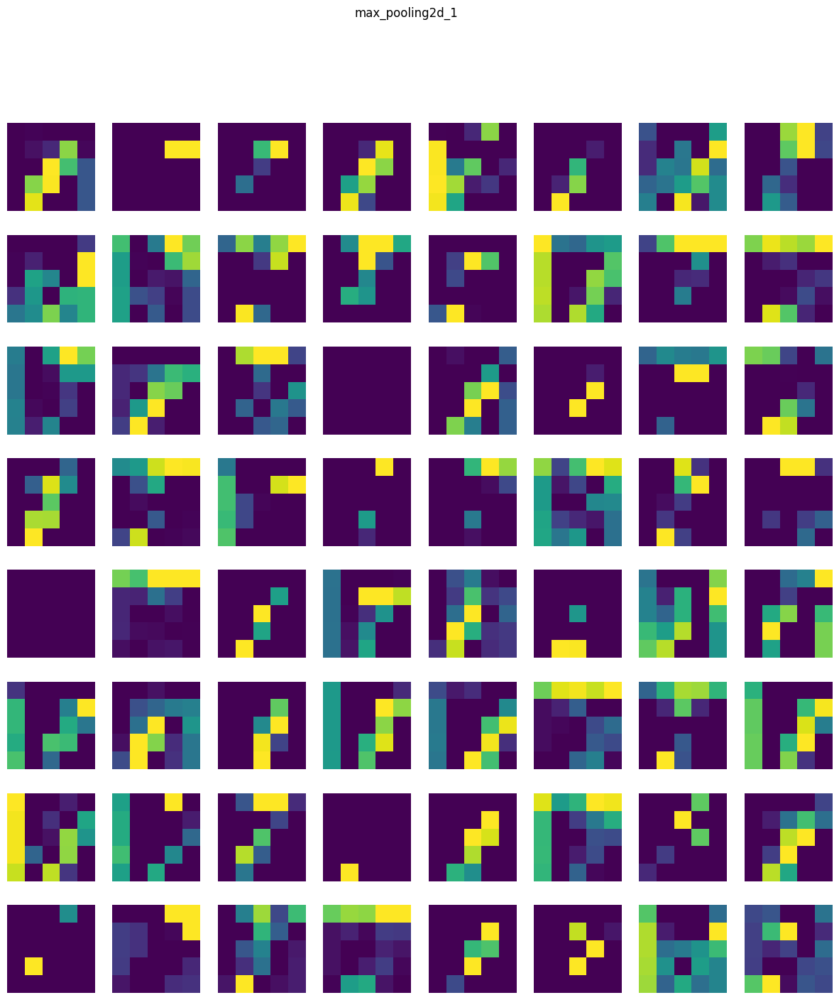

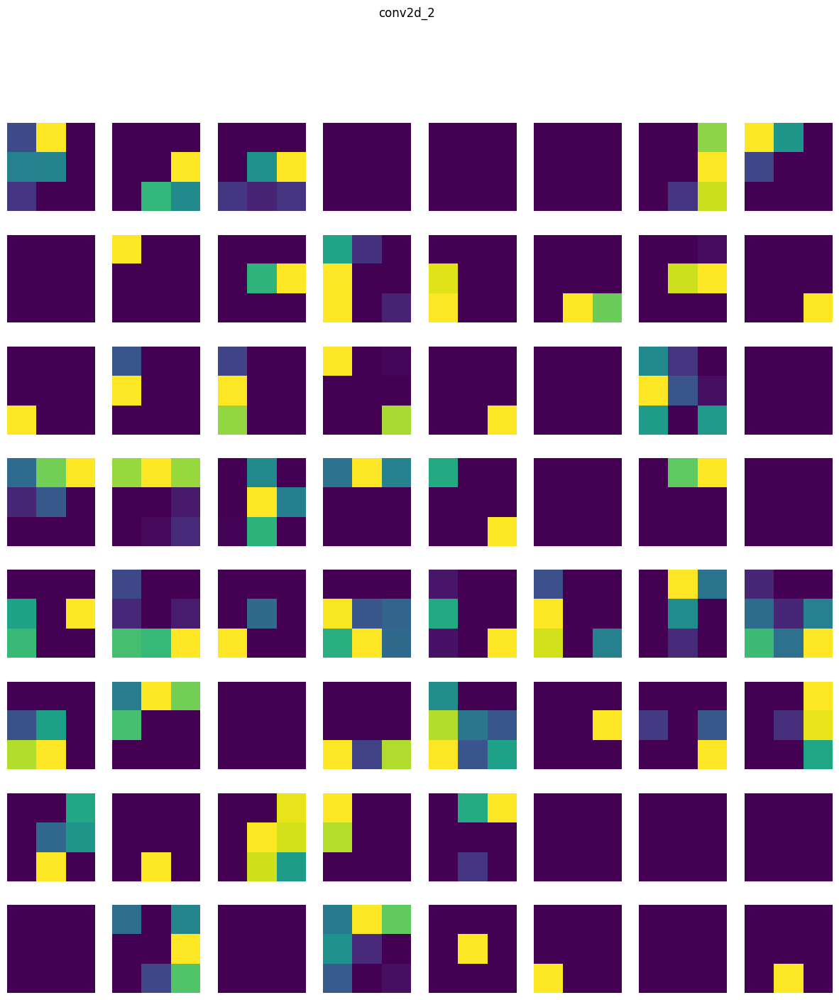

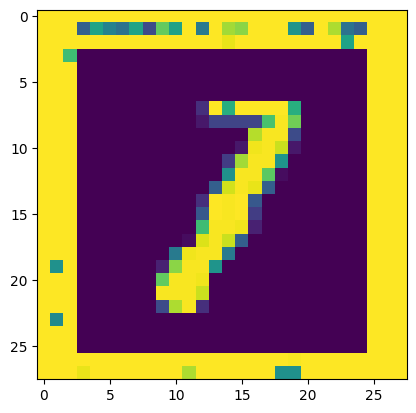

In [ ]:
from tensorflow.keras import models

img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.  # Normaliser les valeurs des pixels

# Créer un modèle intermédiaire pour visualiser les activations de chaque couche
layer_outputs = [layer.output for layer in model.layers[:5]] + [model.layers[-3].output]  # Ajouter la couche dense
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

# Obtenir les activations pour l'image donnée
activations = activation_model.predict(img_tensor)

# Visualiser les activations
layer_names = [layer.name for layer in model.layers[:5]]

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]  # Number of features in the layer
    size = layer_activation.shape[1] if len(layer_activation.shape) > 2 else 1  # Size of spatial activations (height or width, typically the same)

    n_cols = n_features // 8  # Display at most 8 activations per row

    fig, axes = plt.subplots(n_cols, 8, figsize=(15, 2 * n_cols))  # Create subplots

    for col in range(n_cols):
        for row in range(8):
            if len(layer_activation.shape) > 2:
                channel_image = layer_activation[0, :, :, col * 8 + row]
            else:
                channel_image = layer_activation[0, col * 8 + row]

            channel_image -= channel_image.mean()
            channel_image /= (channel_image.std() + 1e-5)  # To avoid division by zero
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')

            axes[col, row].imshow(channel_image, cmap='viridis')
            axes[col, row].axis('off')

    plt.suptitle(layer_name)
    plt.show()

plt.imshow(img)

Saving 9.png to 9.png


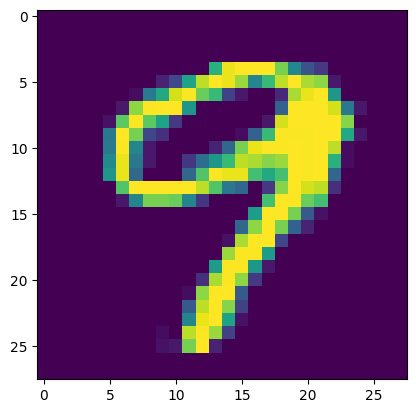

In [ ]:
from google.colab import files
from tensorflow.keras.preprocessing import image

upload = files.upload()
path = list(upload.keys())[0]
img = image.load_img(path, target_size=(28, 28), color_mode='grayscale')
fig=figsize=(8, 8)
plt.imshow(img)

In [ ]:
x = image.img_to_array(img)
x = x[np.newaxis]/255

predict = model.predict(x)

prediction = np.argmax(predict)

print(f"l'image est un: {prediction}")

1/1 [==============================] - 0s 20ms/step
l'image est un: 9


In [ ]:
seconde_max(prediction)


l'image est un: 7
